In [2]:
from youtube_comment_downloader import YoutubeCommentDownloader
import pandas as pd

# Replace with your video ID
video_id = "J_1EXWNETiI"

downloader = YoutubeCommentDownloader()
comments = []

for comment in downloader.get_comments_from_url(f"https://www.youtube.com/watch?v={video_id}", sort_by=0):
    comments.append({
        "text": comment["text"],
        "time": comment["time"],
        "author": comment["author"],
        "votes": comment["votes"],
        "timestamp": comment["time_parsed"]
    })

# Convert to DataFrame and save
df = pd.DataFrame(comments)
df.to_csv("ahsoka_youtube_comments.csv", index=False)

In [4]:
import pandas as pd
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import re

# Load scraped YouTube data
df = pd.read_csv("/Users/johngrier/SSS/Data/Raw/ahsoka_youtube_comments.csv")

# Clean the comment text
def clean_text(text):
    text = str(text)
    text = re.sub(r"http\S+", "", text)              # remove URLs
    text = re.sub(r"[^\w\s]", "", text)              # remove punctuation
    text = re.sub(r"\d+", "", text)                  # remove numbers
    text = text.lower().strip()                      # lowercase
    return text

df["clean_text"] = df["text"].apply(clean_text)

# Initialize VADER
analyzer = SentimentIntensityAnalyzer()

# Apply sentiment scoring
df["vader_score"] = df["clean_text"].apply(lambda x: analyzer.polarity_scores(x)["compound"])

# Optional: Label sentiment class
def label_sentiment(score):
    if score >= 0.05:
        return "positive"
    elif score <= -0.05:
        return "negative"
    else:
        return "neutral"

df["sentiment_label"] = df["vader_score"].apply(label_sentiment)

# Save cleaned and scored version
df.to_csv("/Users/johngrier/SSS/Data/processed/ahsoka_sentiment_vader.csv", index=False)

df.head()

,text,time,author,votes,timestamp,clean_text,vader_score,sentiment_label
0,Imagine telling somebody 10 or 20 years ago th...,1 year ago,@zedonathin330,19K,1.712533e+09,imagine telling somebody or years ago that w...,0.0000,neutral
1,"After seeing Ahsoka beat Maul as a teen, and g...",1 year ago,@alec1631,2.4K,1.712533e+09,after seeing ahsoka beat maul as a teen and go...,-0.7447,negative
2,I never thought I’d live to see the day when t...,1 year ago,@MatthewVlossak,1.4K,1.712533e+09,i never thought id live to see the day when th...,-0.4683,negative
3,"You gotta admit, Ahsoka is one of the best Sta...",1 year ago,@ThatStarWarsGuyyy,616,1.712533e+09,you gotta admit ahsoka is one of the best star...,0.3400,positive
4,I am SO GLAD they kept Lars Mikkelson as Thraw...,1 year ago,@gechoman44iwantahippo,2.7K,1.712533e+09,i am so glad they kept lars mikkelson as thraw...,0.7787,positive


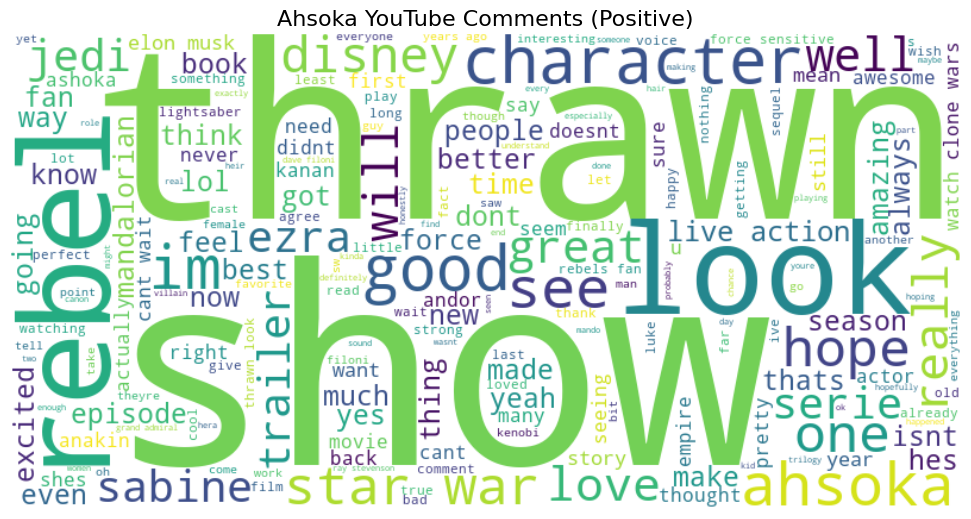

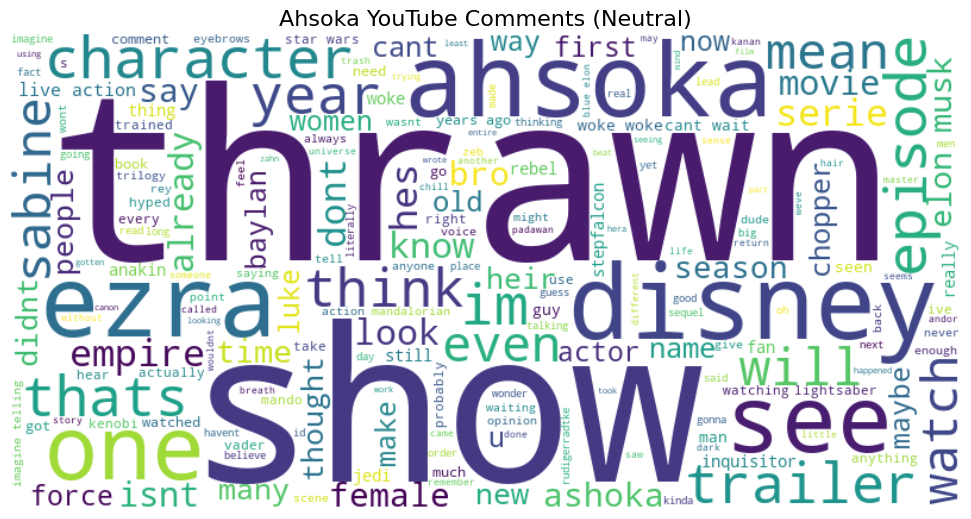

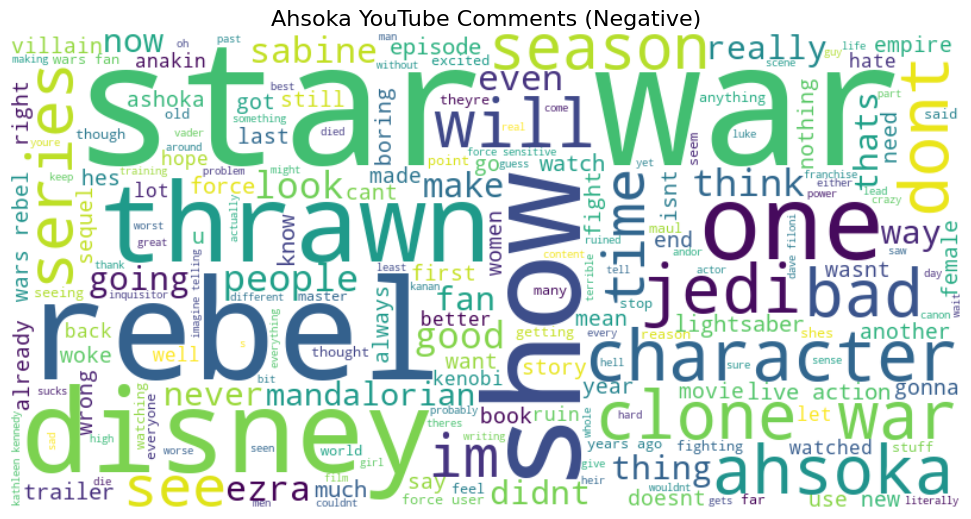

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Load processed sentiment data
df = pd.read_csv("/Users/johngrier/SSS/Data/Processed/ahsoka_sentiment_vader.csv")

# Function to generate and display a word cloud
def plot_wordcloud(text, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(" ".join(text))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(title, fontsize=16)
    plt.tight_layout(pad=0)
    plt.show()

# Optional: Filter for comment length > 2 words
df = df[df['clean_text'].str.split().str.len() > 2]

# Generate word clouds by sentiment
for sentiment in ['positive', 'neutral', 'negative']:
    text_subset = df[df["sentiment_label"] == sentiment]["clean_text"]
    plot_wordcloud(text_subset, f"Ahsoka YouTube Comments ({sentiment.title()})")

In [6]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Load processed sentiment data
df = pd.read_csv("/Users/johngrier/SSS/Data/Processed/ahsoka_sentiment_vader.csv")

# Optional: Filter for longer comments
df = df[df['clean_text'].str.split().str.len() > 2]

# Create directory to save images
output_dir = "/Users/johngrier/SSS/Assets/WordClouds"
os.makedirs(output_dir, exist_ok=True)

# Function to create and save word cloud
def save_wordcloud(text, sentiment_label):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(" ".join(text))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Ahsoka Comments ({sentiment_label.title()})", fontsize=16)
    plt.tight_layout(pad=0)
    
    filename = os.path.join(output_dir, f"ahsoka_wordcloud_{sentiment_label}.png")
    plt.savefig(filename, bbox_inches='tight')
    plt.close()

# Generate and save for each sentiment
for sentiment in ['positive', 'neutral', 'negative']:
    text_subset = df[df["sentiment_label"] == sentiment]["clean_text"]
    save_wordcloud(text_subset, sentiment)

In [17]:
df = pd.read_csv("/Users/johngrier/SSS/Data/Processed/ahsoka_sentiment_vader.csv")
df["date"] = pd.to_datetime(df["timestamp"], unit="s").dt.date

print("Date range:", df["date"].min(), "to", df["date"].max())
print("Most common dates:")
print(df["date"].value_counts().head(10))

Date range: 2024-04-07 to 2025-04-04
Most common dates:
date
2024-04-07    3994
2024-06-07      35
2024-10-07      27
2024-11-08      17
2024-08-07      15
2024-09-07      13
2024-05-07      12
2024-07-07      10
2025-03-08       7
2025-02-08       7
Name: count, dtype: int64


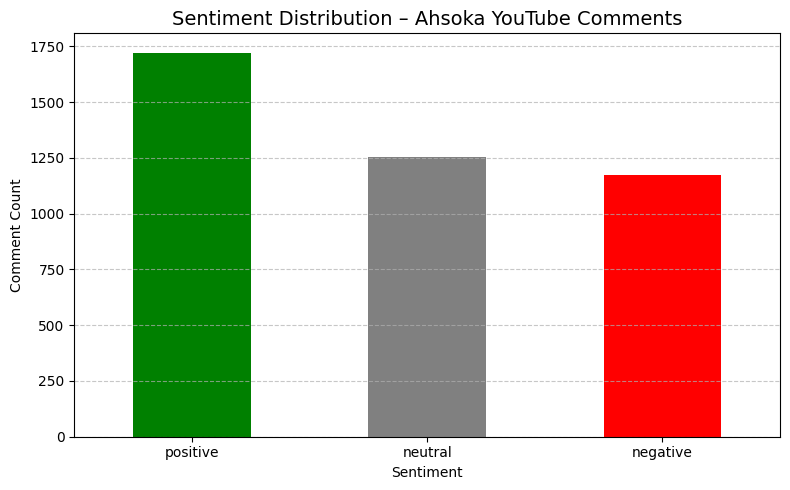

In [18]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your processed data
df = pd.read_csv("/Users/johngrier/SSS/Data/Processed/ahsoka_sentiment_vader.csv")

# Count sentiment labels
sentiment_counts = df["sentiment_label"].value_counts().reindex(["positive", "neutral", "negative"], fill_value=0)

# Plot
plt.figure(figsize=(8, 5))
sentiment_counts.plot(kind="bar", color=["green", "gray", "red"])
plt.title("Sentiment Distribution – Ahsoka YouTube Comments", fontsize=14)
plt.xlabel("Sentiment")
plt.ylabel("Comment Count")
plt.xticks(rotation=0)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()

# Save
plt.savefig("/Users/johngrier/SSS/Assets/Plots/ahsoka_sentiment_distribution.png", bbox_inches="tight")
plt.show()

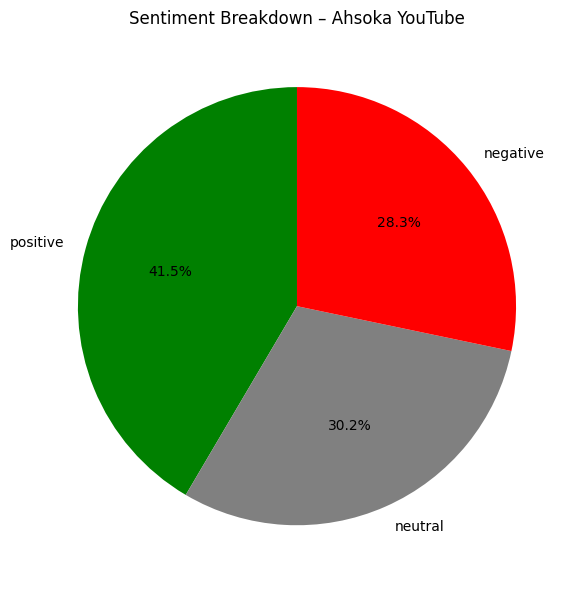

In [19]:
# Pie chart version (optional)
plt.figure(figsize=(6, 6))
colors = ["green", "gray", "red"]
sentiment_counts.plot.pie(autopct='%1.1f%%', colors=colors, startangle=90)
plt.title("Sentiment Breakdown – Ahsoka YouTube")
plt.ylabel("")
plt.tight_layout()
plt.savefig("/Users/johngrier/SSS/Assets/Plots/ahsoka_sentiment_pie.png", bbox_inches="tight")
plt.show()

In [26]:
import praw
import pandas as pd
from datetime import datetime

# Reddit API authentication
reddit = praw.Reddit(
    client_id="YOUR_CLIENT_ID",
    client_secret="YOUR_CLIENT_SECRET",
    user_agent="sentiment analysis script by /u/yourusername"
)

# Example scrape: Ahsoka-related Reddit comments
subreddits = ["StarWars", "television", "DisneyPlus"]
query = "ahsoka"

# Set time window: July 1, 2023 to October 31, 2023
start_date = int(datetime(2023, 7, 1).timestamp())
end_date = int(datetime(2023, 10, 31).timestamp())

# Filter submissions manually within date range
results = []
for sub in subreddits:
    for submission in reddit.subreddit(sub).search(query, sort="new", limit=200):
        if start_date <= submission.created_utc <= end_date:
            submission.comments.replace_more(limit=0)
            for comment in submission.comments:
                results.append({
                    "text": comment.body,
                    "timestamp": comment.created_utc,
                    "subreddit": sub,
                    "score": comment.score
                })

# Save to CSV
df = pd.DataFrame(results)
df["date"] = pd.to_datetime(df["timestamp"], unit="s")
df.to_csv("/Users/johngrier/SSS/Data/Raw/ahsoka_reddit_comments_july_oct_2023.csv", index=False)

print(f"Scraped {len(df)} comments")

Scraped 1807 comments


In [27]:
import pandas as pd
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Load new scraped dataset
df = pd.read_csv("/Users/johngrier/SSS/Data/Raw/ahsoka_reddit_comments_july_oct_2023.csv")

# Clean
def clean_text(text):
    text = str(text)
    text = re.sub(r"http\S+", "", text)
    text = re.sub(r"[^\w\s]", "", text)
    text = re.sub(r"\d+", "", text)
    text = text.lower().strip()
    return text

df["clean_text"] = df["text"].apply(clean_text)

# VADER
analyzer = SentimentIntensityAnalyzer()
df["vader_score"] = df["clean_text"].apply(lambda x: analyzer.polarity_scores(x)["compound"])

def label_sentiment(score):
    if score >= 0.05:
        return "positive"
    elif score <= -0.05:
        return "negative"
    else:
        return "neutral"

df["sentiment_label"] = df["vader_score"].apply(label_sentiment)

# Convert timestamp
df["date"] = pd.to_datetime(df["timestamp"], unit="s").dt.date

# Save processed version
output_path = "/Users/johngrier/SSS/Data/Processed/ahsoka_reddit_sentiment_vader_july_oct_2023.csv"
df.to_csv(output_path, index=False)

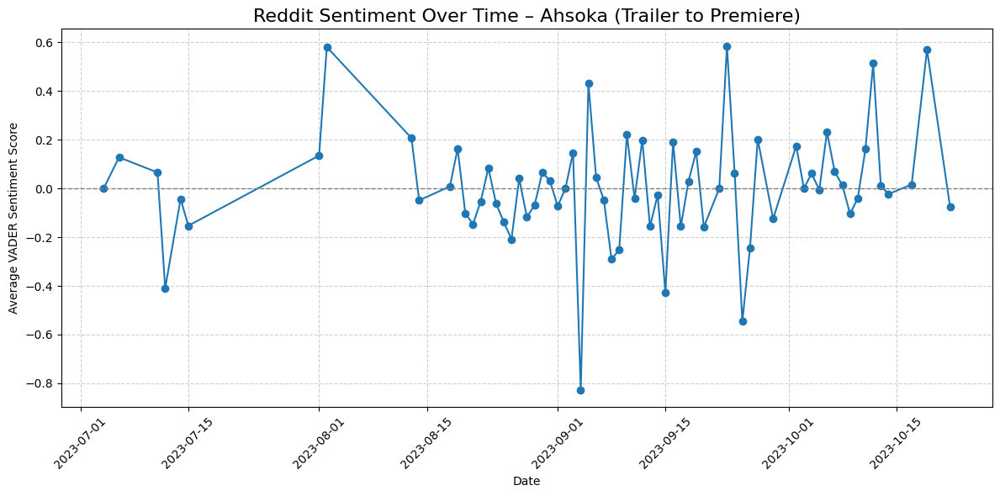

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
from datetime import date

# Load processed Reddit sentiment
df = pd.read_csv("/Users/johngrier/SSS/Data/Processed/ahsoka_reddit_sentiment_vader_july_oct_2023.csv")
df["date"] = pd.to_datetime(df["date"]).dt.date

# trailer → premiere window
cutoff_date = date(2023, 11, 1)
df = df[df["date"] <= cutoff_date]

# Group by date and calculate average sentiment
daily_sentiment = df.groupby("date")["vader_score"].mean().reset_index()

# 📈 Plot
plt.figure(figsize=(12, 6))
plt.plot(daily_sentiment["date"], daily_sentiment["vader_score"], marker='o')
plt.axhline(0, linestyle='--', color='gray', linewidth=1)
plt.title("Reddit Sentiment Over Time – Ahsoka (Trailer to Premiere)", fontsize=16)
plt.xlabel("Date")
plt.ylabel("Average VADER Sentiment Score")
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig("/Users/johngrier/SSS/Assets/Plots/ahsoka_reddit_sentiment_trend_trimmed.png", bbox_inches="tight")
plt.show()

In [31]:
from youtube_comment_downloader import YoutubeCommentDownloader
import pandas as pd

downloader = YoutubeCommentDownloader()
all_comments = []

video_ids = {
    "volume1": "mVsJXiI60a0",
    "volume2": "sBEvEcpnG7k"
}

for label, vid in video_ids.items():
    print(f"Scraping comments for {label}...")
    for comment in downloader.get_comments_from_url(f"https://www.youtube.com/watch?v={vid}", sort_by=0):
        all_comments.append({
            "source": label,
            "text": comment["text"],
            "time": comment["time"],
            "author": comment["author"],
            "votes": comment["votes"],
            "timestamp": comment["time_parsed"]
        })

# Save combined dataset
df = pd.DataFrame(all_comments)
df.to_csv("/Users/johngrier/SSS/Data/Raw/stranger_things_youtube_comments_combined.csv", index=False)
print(f"Total comments scraped: {len(df)}")

Scraping comments for volume1...
Scraping comments for volume2...
Total comments scraped: 6924


In [32]:
import pandas as pd
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Load combined dataset
df = pd.read_csv("/Users/johngrier/SSS/Data/Raw/stranger_things_youtube_comments_combined.csv")

# Clean the comment text
def clean_text(text):
    text = str(text)
    text = re.sub(r"http\S+", "", text)
    text = re.sub(r"[^\w\s]", "", text)
    text = re.sub(r"\d+", "", text)
    text = text.lower().strip()
    return text

df["clean_text"] = df["text"].apply(clean_text)

# Apply VADER
analyzer = SentimentIntensityAnalyzer()
df["vader_score"] = df["clean_text"].apply(lambda x: analyzer.polarity_scores(x)["compound"])

# Label sentiment
def label_sentiment(score):
    if score >= 0.05:
        return "positive"
    elif score <= -0.05:
        return "negative"
    else:
        return "neutral"

df["sentiment_label"] = df["vader_score"].apply(label_sentiment)

# Save for analysis
output_path = "/Users/johngrier/SSS/Data/Processed/stranger_things_youtube_sentiment_combined.csv"
df.to_csv(output_path, index=False)
print(f"Saved processed sentiment data to: {output_path}")

Saved processed sentiment data to: /Users/johngrier/SSS/Data/Processed/stranger_things_youtube_sentiment_combined.csv


In [33]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import os

# Load processed sentiment data
df = pd.read_csv("/Users/johngrier/SSS/Data/Processed/stranger_things_youtube_sentiment_combined.csv")

# Filter out very short comments (optional)
df = df[df['clean_text'].str.split().str.len() > 2]

# Output folder
output_dir = "/Users/johngrier/SSS/Assets/WordClouds"
os.makedirs(output_dir, exist_ok=True)

# Generate and save word cloud
def save_wordcloud(text, sentiment_label):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(" ".join(text))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Stranger Things YouTube Comments ({sentiment_label.title()})", fontsize=16)
    plt.tight_layout(pad=0)

    filename = os.path.join(output_dir, f"stranger_things_wordcloud_{sentiment_label}.png")
    plt.savefig(filename, bbox_inches="tight")
    plt.close()

# Create word clouds by sentiment
for sentiment in ['positive', 'neutral', 'negative']:
    text_subset = df[df["sentiment_label"] == sentiment]["clean_text"]
    save_wordcloud(text_subset, sentiment)

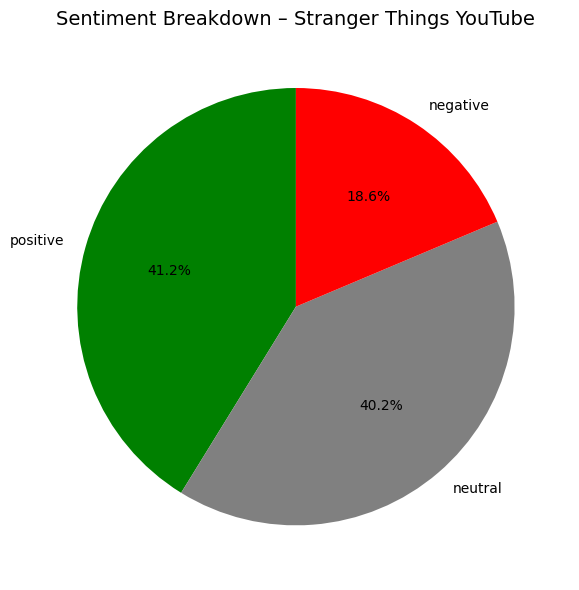

In [34]:
import matplotlib.pyplot as plt
import pandas as pd

# Load sentiment data
df = pd.read_csv("/Users/johngrier/SSS/Data/Processed/stranger_things_youtube_sentiment_combined.csv")

# Count by sentiment
sentiment_counts = df["sentiment_label"].value_counts().reindex(["positive", "neutral", "negative"], fill_value=0)

# Plot
plt.figure(figsize=(6, 6))
sentiment_counts.plot.pie(autopct='%1.1f%%', colors=["green", "gray", "red"], startangle=90)
plt.title("Sentiment Breakdown – Stranger Things YouTube", fontsize=14)
plt.ylabel("")
plt.tight_layout()

plt.savefig("/Users/johngrier/SSS/Assets/Plots/stranger_things_sentiment_pie.png", bbox_inches="tight")
plt.show()

In [42]:
from youtube_comment_downloader import YoutubeCommentDownloader
import pandas as pd

downloader = YoutubeCommentDownloader()
all_comments = []

video_ids = {
    "volume1": "mVsJXiI60a0",
    "volume2": "sBEvEcpnG7k"
}

for label, vid in video_ids.items():
    print(f"Scraping comments for {label}...")
    for comment in downloader.get_comments_from_url(f"https://www.youtube.com/watch?v={vid}", sort_by=0):
        all_comments.append({
            "source": label,
            "text": comment["text"],
            "time": comment["time"],  # this is relative (e.g., '1 year ago')
            "author": comment["author"],
            "votes": comment["votes"],
            "timestamp": comment["time_parsed"]  # may default to scrape date
        })

df = pd.DataFrame(all_comments)
df.to_csv("/Users/johngrier/SSS/Data/Raw/stranger_things_youtube_comments_combined.csv", index=False)
print(f"Scraped {len(df)} Stranger Things trailer comments.")

Scraping comments for volume1...
Scraping comments for volume2...
Scraped 6924 Stranger Things trailer comments.


In [44]:
import pandas as pd
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Load combined YouTube comments
df = pd.read_csv("/Users/johngrier/SSS/Data/Raw/stranger_things_youtube_comments_combined.csv")

# Clean text
def clean_text(text):
    text = str(text)
    text = re.sub(r"http\S+", "", text)
    text = re.sub(r"[^\w\s]", "", text)
    text = re.sub(r"\d+", "", text)
    return text.lower().strip()

df["clean_text"] = df["text"].apply(clean_text)

analyzer = SentimentIntensityAnalyzer()

# Score each comment
df["vader_score"] = df["clean_text"].apply(lambda x: analyzer.polarity_scores(x)["compound"])

# Label each comment as positive, neutral, or negative
def label_sentiment(score):
    if score >= 0.05:
        return "positive"
    elif score <= -0.05:
        return "negative"
    else:
        return "neutral"

df["sentiment_label"] = df["vader_score"].apply(label_sentiment)

output_path = "/Users/johngrier/SSS/Data/Processed/stranger_things_youtube_sentiment_combined.csv"
df.to_csv(output_path, index=False)
print(f"Saved processed sentiment data to: {output_path}")

Saved processed sentiment data to: /Users/johngrier/SSS/Data/Processed/stranger_things_youtube_sentiment_combined.csv


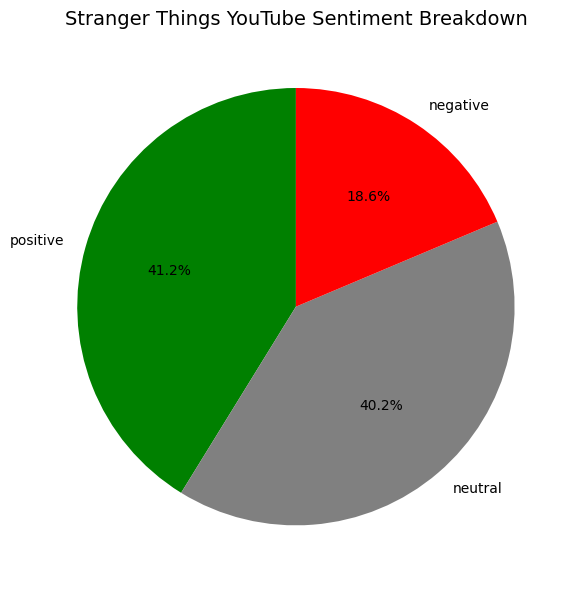

In [45]:
import matplotlib.pyplot as plt

# Count sentiment labels
sentiment_counts = df["sentiment_label"].value_counts().reindex(["positive", "neutral", "negative"], fill_value=0)

# Pie chart
plt.figure(figsize=(6, 6))
sentiment_counts.plot.pie(autopct='%1.1f%%', colors=["green", "gray", "red"], startangle=90)
plt.title("Stranger Things YouTube Sentiment Breakdown", fontsize=14)
plt.ylabel("")
plt.tight_layout()
plt.savefig("/Users/johngrier/SSS/Assets/Plots/stranger_things_sentiment_pie.png", bbox_inches="tight")
plt.show()

In [53]:
import praw
import pandas as pd

reddit = praw.Reddit(
    client_id="YOUR_CLIENT_ID",
    client_secret="YOUR_CLIENT_SECRET",
    user_agent="sentiment analysis script by /u/yourusername"
)

subreddits = ["StrangerThings", "television", "netflix"]
query = "stranger things"

results = []

for sub in subreddits:
    for submission in reddit.subreddit(sub).search(query, sort="new", limit=1000):
        submission.comments.replace_more(limit=0)
        for comment in submission.comments:
            try:
                results.append({
                    "text": comment.body,
                    "created_utc": comment.created_utc,
                    "subreddit": sub,
                    "score": comment.score
                })
            except AttributeError:
                continue

df = pd.DataFrame(results)

if "created_utc" in df.columns:
    df["date"] = pd.to_datetime(df["created_utc"], unit="s")
    df.to_csv("/Users/johngrier/SSS/Data/Raw/stranger_things_reddit_comments_recent.csv", index=False)
    print(f"Saved {len(df)} Stranger Things Reddit comments (recent).")
else:
    print("Still no 'created_utc' found. Something else is wrong.")

Saved 17745 Stranger Things Reddit comments (recent).


In [55]:
import pandas as pd
import re
from datetime import datetime
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Load scraped Reddit data
df = pd.read_csv("/Users/johngrier/SSS/Data/Raw/stranger_things_reddit_comments_recent.csv")

# Clean the comment text
def clean_text(text):
    text = str(text)
    text = re.sub(r"http\S+", "", text)
    text = re.sub(r"[^\w\s]", "", text)
    text = re.sub(r"\d+", "", text)
    return text.lower().strip()

df["clean_text"] = df["text"].apply(clean_text)

# Initialize VADER
analyzer = SentimentIntensityAnalyzer()

# Score and label each comment
df["vader_score"] = df["clean_text"].apply(lambda x: analyzer.polarity_scores(x)["compound"])

def label_sentiment(score):
    if score >= 0.05:
        return "positive"
    elif score <= -0.05:
        return "negative"
    else:
        return "neutral"

df["sentiment_label"] = df["vader_score"].apply(label_sentiment)

# Convert string to datetime
df["date"] = pd.to_datetime(df["date"])

start_date = datetime(2022, 4, 1)
end_date = datetime(2022, 8, 1)

df_s4 = df[(df["date"] >= start_date) & (df["date"] <= end_date)]

output_path = "/Users/johngrier/SSS/Data/Processed/stranger_things_reddit_sentiment_s4.csv"
df.to_csv(output_path, index=False)
print(f"Saved processed sentiment data to: {output_path}")

Saved processed sentiment data to: /Users/johngrier/SSS/Data/Processed/stranger_things_reddit_sentiment_s4.csv


In [58]:
print("Earliest date:", df_s4["date"].min())
print("Latest date:", df_s4["date"].max())
print("Date range preview:", df_s4["date"].value_counts().sort_index().head(10))

Earliest date: 2022-08-28
Latest date: 2025-04-08
Date range preview: date
2022-08-28     3
2022-08-30     7
2022-09-01    12
2022-09-02     9
2022-09-04    37
2022-09-05    46
2022-09-06    36
2022-09-07    53
2022-09-08     1
2022-09-10     6
Name: count, dtype: int64


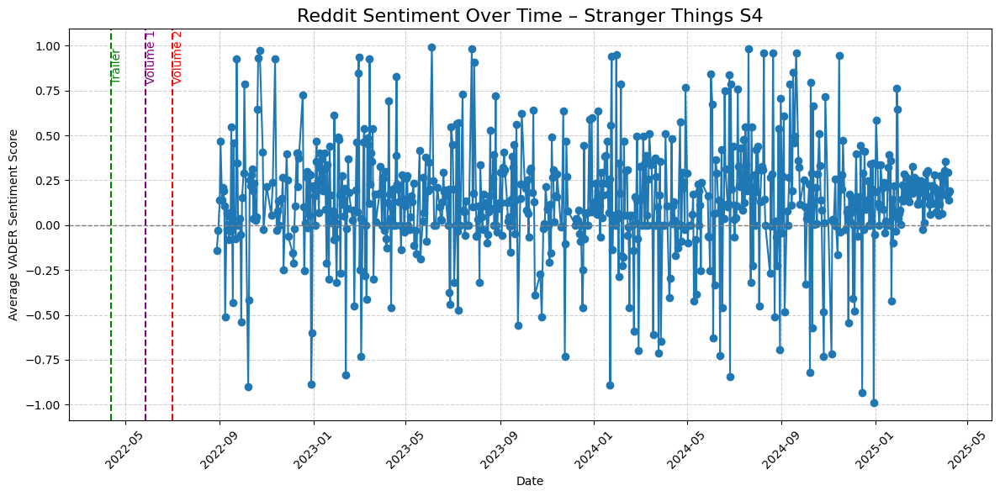

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
from datetime import date

# Load filtered data
df_s4 = pd.read_csv("/Users/johngrier/SSS/Data/Processed/stranger_things_reddit_sentiment_s4.csv")
df_s4["date"] = pd.to_datetime(df_s4["date"]).dt.date

# Daily average sentiment
daily_sentiment = df_s4.groupby("date")["vader_score"].mean().reset_index()

# Plot
plt.figure(figsize=(12, 6))
plt.plot(daily_sentiment["date"], daily_sentiment["vader_score"], marker='o', color='tab:blue')
plt.axhline(0, linestyle="--", color="gray", linewidth=1)
plt.title("Reddit Sentiment Over Time – Stranger Things S4", fontsize=16)
plt.xlabel("Date")
plt.ylabel("Average VADER Sentiment Score")
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)

# Annotate events (same as before)
from datetime import date
plt.axvline(date(2022, 4, 12), color="green", linestyle="--")
plt.text(date(2022, 4, 12), 0.8, "Trailer", color="green", rotation=90)

plt.axvline(date(2022, 5, 27), color="purple", linestyle="--")
plt.text(date(2022, 5, 27), 0.8, "Volume 1", color="purple", rotation=90)

plt.axvline(date(2022, 7, 1), color="red", linestyle="--")
plt.text(date(2022, 7, 1), 0.8, "Volume 2", color="red", rotation=90)

plt.tight_layout()
plt.savefig("/Users/johngrier/SSS/Assets/Plots/stranger_things_reddit_sentiment_trend_s4_fixed.png", bbox_inches="tight")
plt.show()

In [59]:
from youtube_comment_downloader import YoutubeCommentDownloader
import pandas as pd

video_id = "uLtkt8BonwM"  # The Last of Us official trailer (HBO)

downloader = YoutubeCommentDownloader()
comments = []

for comment in downloader.get_comments_from_url(f"https://www.youtube.com/watch?v={video_id}", sort_by=0):
    comments.append({
        "text": comment["text"],
        "time": comment["time"],
        "author": comment["author"],
        "votes": comment["votes"],
        "timestamp": comment["time_parsed"]
    })

# Convert to DataFrame and save
df = pd.DataFrame(comments)
df.to_csv("/Users/johngrier/SSS/Data/Raw/last_of_us_youtube_comments.csv", index=False)

print(f"Scraped {len(df)} comments from The Last of Us trailer.")

Scraped 5191 comments from The Last of Us trailer.


In [60]:
import pandas as pd
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Load the scraped data
df = pd.read_csv("/Users/johngrier/SSS/Data/Raw/last_of_us_youtube_comments.csv")

# Clean the text
def clean_text(text):
    text = str(text)
    text = re.sub(r"http\S+", "", text)
    text = re.sub(r"[^\w\s]", "", text)
    text = re.sub(r"\d+", "", text)
    return text.lower().strip()

df["clean_text"] = df["text"].apply(clean_text)

# Apply VADER sentiment analysis
analyzer = SentimentIntensityAnalyzer()
df["vader_score"] = df["clean_text"].apply(lambda x: analyzer.polarity_scores(x)["compound"])

# Label the sentiment
def label_sentiment(score):
    if score >= 0.05:
        return "positive"
    elif score <= -0.05:
        return "negative"
    else:
        return "neutral"

df["sentiment_label"] = df["vader_score"].apply(label_sentiment)

# Save processed version
output_path = "/Users/johngrier/SSS/Data/Processed/last_of_us_youtube_sentiment.csv"
df.to_csv(output_path, index=False)
print(f"Cleaned and scored sentiment saved to: {output_path}")

Cleaned and scored sentiment saved to: /Users/johngrier/SSS/Data/Processed/last_of_us_youtube_sentiment.csv


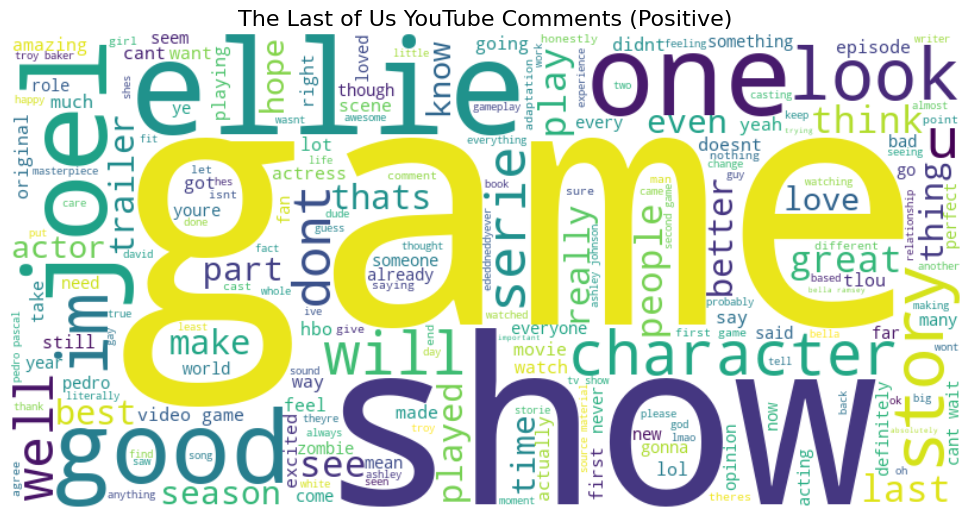

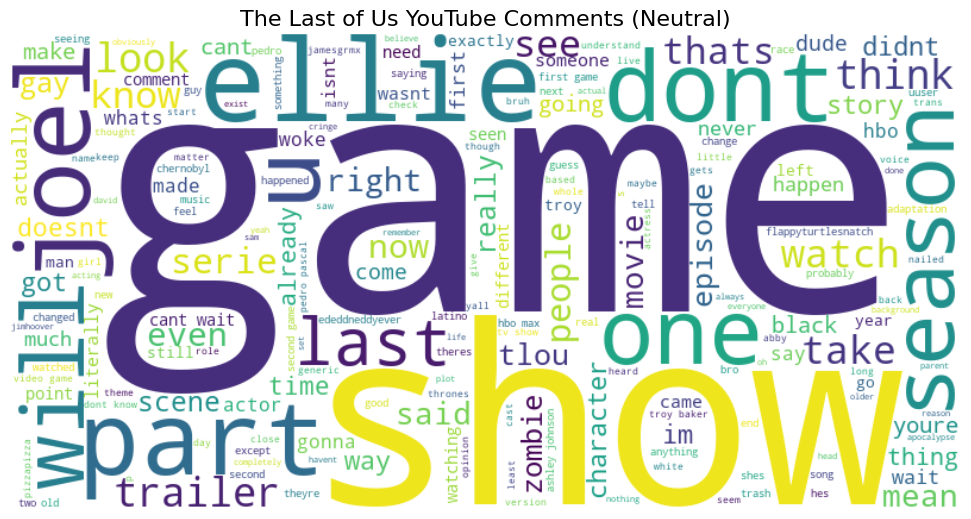

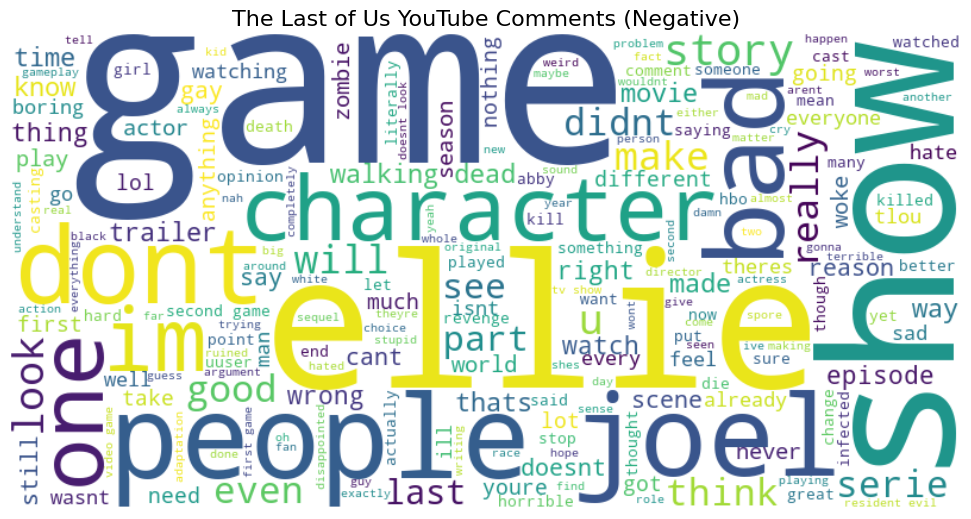

In [61]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import os

# Filter out short comments
df = df[df['clean_text'].str.split().str.len() > 2]

# Output directory
output_dir = "/Users/johngrier/SSS/Assets/WordClouds"
os.makedirs(output_dir, exist_ok=True)

# Generate and save word cloud
def save_wordcloud(text, sentiment_label):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(" ".join(text))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"The Last of Us YouTube Comments ({sentiment_label.title()})", fontsize=16)
    plt.tight_layout(pad=0)

    filename = os.path.join(output_dir, f"last_of_us_wordcloud_{sentiment_label}.png")
    plt.savefig(filename, bbox_inches="tight")
    plt.show()

# Generate clouds
for sentiment in ['positive', 'neutral', 'negative']:
    subset = df[df["sentiment_label"] == sentiment]["clean_text"]
    save_wordcloud(subset, sentiment)

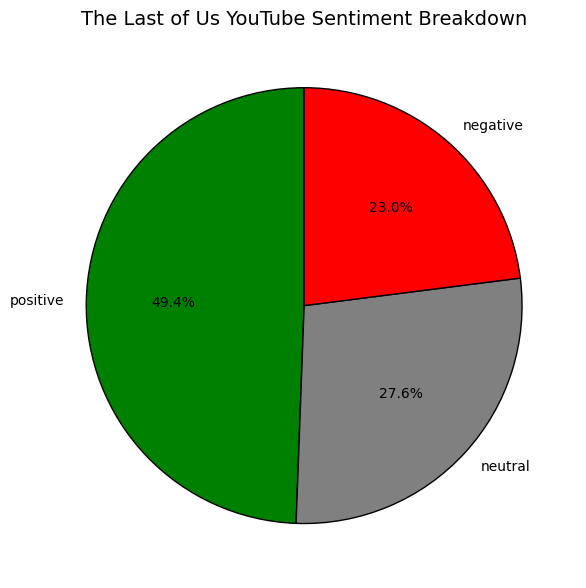

In [62]:
import pandas as pd
import matplotlib.pyplot as plt

# Load cleaned + scored data
df = pd.read_csv("/Users/johngrier/SSS/Data/Processed/last_of_us_youtube_sentiment.csv")

# Count sentiment labels
sentiment_counts = df["sentiment_label"].value_counts().reindex(["positive", "neutral", "negative"], fill_value=0)

# Pie chart
plt.figure(figsize=(6, 6))
sentiment_counts.plot.pie(
    autopct='%1.1f%%',
    colors=["green", "gray", "red"],
    startangle=90,
    label="",
    wedgeprops={'linewidth': 1, 'edgecolor': 'black'}
)

plt.title("The Last of Us YouTube Sentiment Breakdown", fontsize=14)
plt.tight_layout()
plt.savefig("/Users/johngrier/SSS/Assets/Plots/last_of_us_sentiment_pie.png", bbox_inches="tight")
plt.show()

In [63]:
import praw
import pandas as pd
from datetime import datetime

# Reddit credentials
reddit = praw.Reddit(
    client_id="YOUR_CLIENT_ID",
    client_secret="YOUR_CLIENT_SECRET",
    user_agent="sentiment analysis script by /u/yourusername"
)

# Target time window
start_date = int(datetime(2023, 1, 1).timestamp())
end_date = int(datetime(2023, 4, 1).timestamp())

# Subreddits + search query
subreddits = ["TheLastOfUsHBO", "television", "HBOMAX"]
query = "the last of us"

results = []

for sub in subreddits:
    for submission in reddit.subreddit(sub).search(query, sort="new", limit=1000):
        submission.comments.replace_more(limit=0)
        for comment in submission.comments:
            try:
                if start_date <= comment.created_utc <= end_date:
                    results.append({
                        "text": comment.body,
                        "created_utc": comment.created_utc,
                        "subreddit": sub,
                        "score": comment.score
                    })
            except AttributeError:
                continue

# Save to file
df = pd.DataFrame(results)
df["date"] = pd.to_datetime(df["created_utc"], unit="s")
df.to_csv("/Users/johngrier/SSS/Data/Raw/last_of_us_reddit_comments_s1.csv", index=False)
print(f"Scraped {len(df)} Reddit comments for The Last of Us Season 1.")

Scraped 592 Reddit comments for The Last of Us Season 1.


In [64]:
import pandas as pd
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Load scraped data
df = pd.read_csv("/Users/johngrier/SSS/Data/Raw/last_of_us_reddit_comments_s1.csv")

# Clean the text
def clean_text(text):
    text = str(text)
    text = re.sub(r"http\S+", "", text)
    text = re.sub(r"[^\w\s]", "", text)
    text = re.sub(r"\d+", "", text)
    return text.lower().strip()

df["clean_text"] = df["text"].apply(clean_text)

# Apply VADER
analyzer = SentimentIntensityAnalyzer()
df["vader_score"] = df["clean_text"].apply(lambda x: analyzer.polarity_scores(x)["compound"])

# Label sentiment
def label_sentiment(score):
    if score >= 0.05:
        return "positive"
    elif score <= -0.05:
        return "negative"
    else:
        return "neutral"

df["sentiment_label"] = df["vader_score"].apply(label_sentiment)

# Save processed file
output_path = "/Users/johngrier/SSS/Data/Processed/last_of_us_reddit_sentiment_s1.csv"
df.to_csv(output_path, index=False)
print(f"Cleaned and scored Reddit sentiment saved to: {output_path}")

Cleaned and scored Reddit sentiment saved to: /Users/johngrier/SSS/Data/Processed/last_of_us_reddit_sentiment_s1.csv


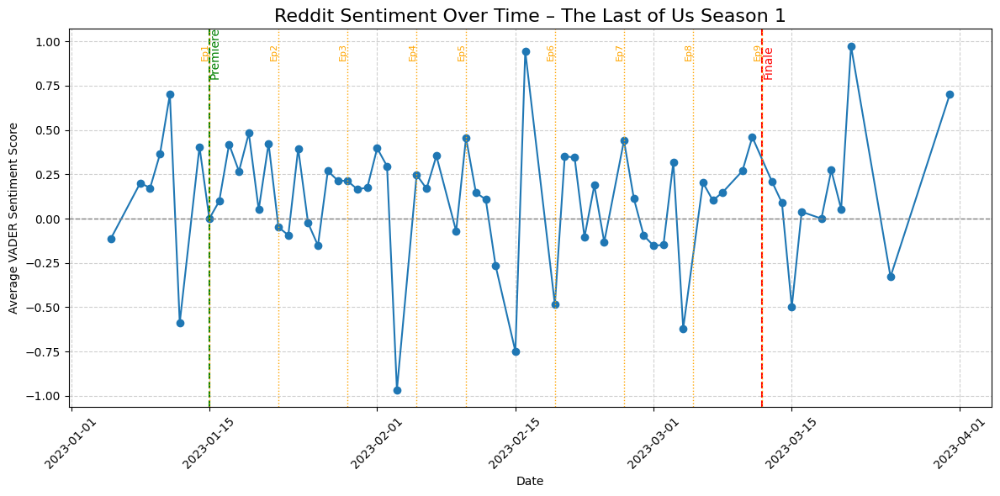

In [66]:
import pandas as pd
import matplotlib.pyplot as plt
from datetime import date

# Load the processed data
df = pd.read_csv("/Users/johngrier/SSS/Data/Processed/last_of_us_reddit_sentiment_s1.csv")
df["date"] = pd.to_datetime(df["date"]).dt.date

# Group by day and compute average sentiment
daily_sentiment = df.groupby("date")["vader_score"].mean().reset_index()

# Plot
plt.figure(figsize=(12, 6))
plt.plot(daily_sentiment["date"], daily_sentiment["vader_score"], marker='o', color='tab:blue')
plt.axhline(0, linestyle='--', color='gray', linewidth=1)
plt.title("Reddit Sentiment Over Time – The Last of Us Season 1", fontsize=16)
plt.xlabel("Date")
plt.ylabel("Average VADER Sentiment Score")
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)

# Optional annotations: premiere + finale
plt.axvline(date(2023, 1, 15), color="green", linestyle="--")
plt.text(date(2023, 1, 15), 0.8, "Premiere", color="green", rotation=90)

plt.axvline(date(2023, 3, 12), color="red", linestyle="--")
plt.text(date(2023, 3, 12), 0.8, "Finale", color="red", rotation=90)

from datetime import date

# Episode air dates
episodes = {
    "Ep1": date(2023, 1, 15),
    "Ep2": date(2023, 1, 22),
    "Ep3": date(2023, 1, 29),
    "Ep4": date(2023, 2, 5),
    "Ep5": date(2023, 2, 10),  # Aired early on a Friday
    "Ep6": date(2023, 2, 19),
    "Ep7": date(2023, 2, 26),
    "Ep8": date(2023, 3, 5),
    "Ep9": date(2023, 3, 12)   # Finale (already labeled)
}

# Add episode lines and labels to your plot (after plotting the trend)
for ep, air_date in episodes.items():
    plt.axvline(air_date, linestyle=":", color="orange", linewidth=1)
    plt.text(air_date, 0.9, ep, rotation=90, color="orange", fontsize=8, ha='right')

# Save
plt.tight_layout()
plt.savefig("/Users/johngrier/SSS/Assets/Plots/last_of_us_reddit_sentiment_trend_s1.png", bbox_inches="tight")
plt.show()

In [67]:
import praw
import pandas as pd
from datetime import datetime

# Reddit API credentials
reddit = praw.Reddit(
    client_id="YOUR_CLIENT_ID",
    client_secret="YOUR_CLIENT_SECRET",
    user_agent="sentiment analysis script by /u/yourusername"
)

# Time range
start_date = int(datetime(2023, 1, 1).timestamp())
end_date = int(datetime(2023, 10, 10).timestamp())

# Subreddits to target
subreddits = ["StarWars", "television", "DisneyPlus"]
query = "ahsoka"

results = []

for sub in subreddits:
    for submission in reddit.subreddit(sub).search(query, sort="new", limit=1000):
        submission.comments.replace_more(limit=0)
        for comment in submission.comments:
            try:
                if start_date <= comment.created_utc <= end_date:
                    results.append({
                        "text": comment.body,
                        "created_utc": comment.created_utc,
                        "subreddit": sub,
                        "score": comment.score
                    })
            except AttributeError:
                continue

# Save to CSV
df = pd.DataFrame(results)
df["date"] = pd.to_datetime(df["created_utc"], unit="s")
df.to_csv("/Users/johngrier/SSS/Data/Raw/ahsoka_reddit_comments_full.csv", index=False)

print(f"Scraped {len(df)} Reddit comments for Ahsoka (Jan–Oct 2023).")

Scraped 2300 Reddit comments for Ahsoka (Jan–Oct 2023).


In [69]:
import pandas as pd
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Load scraped Ahsoka Reddit data
df = pd.read_csv("/Users/johngrier/SSS/Data/Raw/ahsoka_reddit_comments_full.csv")

# Clean the comment text
def clean_text(text):
    text = str(text)
    text = re.sub(r"http\S+", "", text)
    text = re.sub(r"[^\w\s]", "", text)
    text = re.sub(r"\d+", "", text)
    return text.lower().strip()

df["clean_text"] = df["text"].apply(clean_text)

# Apply VADER
analyzer = SentimentIntensityAnalyzer()
df["vader_score"] = df["clean_text"].apply(lambda x: analyzer.polarity_scores(x)["compound"])

# Label sentiment
def label_sentiment(score):
    if score >= 0.05:
        return "positive"
    elif score <= -0.05:
        return "negative"
    else:
        return "neutral"

df["sentiment_label"] = df["vader_score"].apply(label_sentiment)

output_path = "/Users/johngrier/SSS/Data/Processed/ahsoka_reddit_sentiment_full.csv"
df.to_csv(output_path, index=False)
print(f"Saved processed Ahsoka Reddit sentiment to: {output_path}")

Saved processed Ahsoka Reddit sentiment to: /Users/johngrier/SSS/Data/Processed/ahsoka_reddit_sentiment_full.csv


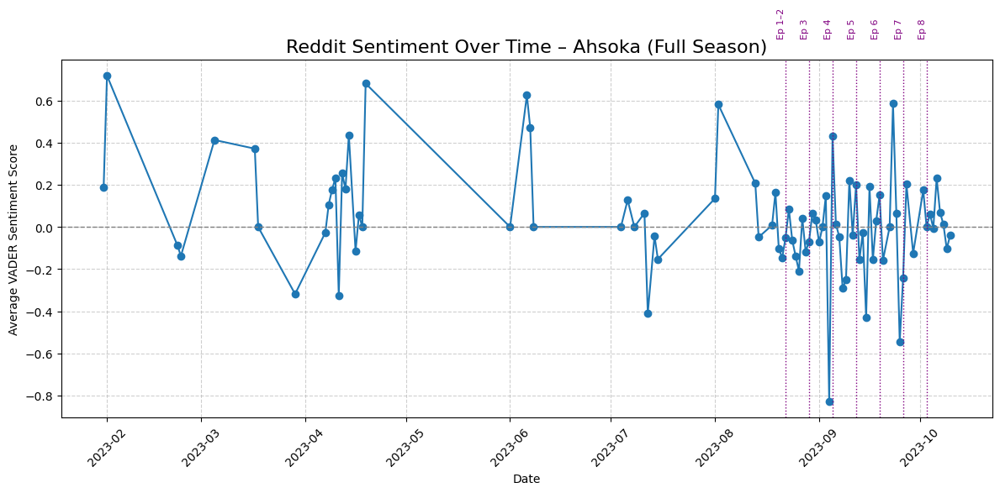

In [70]:
import pandas as pd
import matplotlib.pyplot as plt
from datetime import date

# Load processed sentiment
df = pd.read_csv("/Users/johngrier/SSS/Data/Processed/ahsoka_reddit_sentiment_full.csv")
df["date"] = pd.to_datetime(df["date"]).dt.date

# Group by date
daily_sentiment = df.groupby("date")["vader_score"].mean().reset_index()

# Plot
plt.figure(figsize=(12, 6))
plt.plot(daily_sentiment["date"], daily_sentiment["vader_score"], marker='o', color='tab:blue')
plt.axhline(0, linestyle="--", color="gray", linewidth=1)
plt.title("Reddit Sentiment Over Time – Ahsoka (Full Season)", fontsize=16)
plt.xlabel("Date")
plt.ylabel("Average VADER Sentiment Score")
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)

# Episode annotations
episode_dates = {
    "Ep 1–2": date(2023, 8, 22),
    "Ep 3": date(2023, 8, 29),
    "Ep 4": date(2023, 9, 5),
    "Ep 5": date(2023, 9, 12),
    "Ep 6": date(2023, 9, 19),
    "Ep 7": date(2023, 9, 26),
    "Ep 8": date(2023, 10, 3)
}

for ep, d in episode_dates.items():
    plt.axvline(d, linestyle=":", color="purple", linewidth=1)
    plt.text(d, 0.9, ep, rotation=90, color="purple", fontsize=8, ha='right')

# Save
plt.tight_layout()
plt.savefig("/Users/johngrier/SSS/Assets/Plots/ahsoka_reddit_sentiment_trend_full.png", bbox_inches="tight")
plt.show()

In [77]:
import praw
import pandas as pd
from datetime import datetime

# Reddit credentials
reddit = praw.Reddit(
    client_id="YOUR_CLIENT_ID",
    client_secret="YOUR_CLIENT_SECRET",
    user_agent="sentiment analysis script by /u/yourusername"
)

# Time range
start_date = int(datetime(2023, 1, 1).timestamp())
end_date = int(datetime(2023, 3, 1).timestamp())

subreddits = ["television", "HBOMAX", "scoobydoo", "Velma"]
query = "velma"

results = []

for sub in subreddits:
    for submission in reddit.subreddit(sub).search(query, sort="new", limit=1000):
        submission.comments.replace_more(limit=0)
        for comment in submission.comments:
            try:
                if start_date <= comment.created_utc <= end_date:
                    results.append({
                        "text": comment.body,
                        "created_utc": comment.created_utc,
                        "subreddit": sub,
                        "score": comment.score
                    })
            except AttributeError:
                continue

# Save
df = pd.DataFrame(results)
df["date"] = pd.to_datetime(df["created_utc"], unit="s")
df.to_csv("/Users/johngrier/SSS/Data/Raw/velma_reddit_comments_s1.csv", index=False)

print(f"Scraped {len(df)} Reddit comments for Velma.")

Scraped 2172 Reddit comments for Velma.


In [72]:
from youtube_comment_downloader import YoutubeCommentDownloader
import pandas as pd

downloader = YoutubeCommentDownloader()
all_comments = []

video_ids = {
    "IGN": "YXI7hlGblVA",
    "RottenTomatoes": "KfaGnvgBHXE"
}

for label, vid in video_ids.items():
    print(f"Scraping comments for {label}...")
    for comment in downloader.get_comments_from_url(f"https://www.youtube.com/watch?v={vid}", sort_by=0):
        all_comments.append({
            "source": label,
            "text": comment["text"],
            "time": comment["time"],
            "author": comment["author"],
            "votes": comment["votes"],
            "timestamp": comment["time_parsed"]
        })

# Save combined
df = pd.DataFrame(all_comments)
df.to_csv("/Users/johngrier/SSS/Data/Raw/velma_youtube_comments_combined.csv", index=False)
print(f"Scraped {len(df)} total comments from Velma trailers.")

Scraping comments for IGN...
Scraping comments for RottenTomatoes...
Scraped 4090 total comments from Velma trailers.


In [74]:
import pandas as pd
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Load combined comments
df = pd.read_csv("/Users/johngrier/SSS/Data/Raw/velma_youtube_comments_combined.csv")

# Clean text
def clean_text(text):
    text = str(text)
    text = re.sub(r"http\S+", "", text)
    text = re.sub(r"[^\w\s]", "", text)
    text = re.sub(r"\d+", "", text)
    return text.lower().strip()

df["clean_text"] = df["text"].apply(clean_text)

# VADER analysis
analyzer = SentimentIntensityAnalyzer()
df["vader_score"] = df["clean_text"].apply(lambda x: analyzer.polarity_scores(x)["compound"])

# Label sentiment
def label_sentiment(score):
    if score >= 0.05:
        return "positive"
    elif score <= -0.05:
        return "negative"
    else:
        return "neutral"

df["sentiment_label"] = df["vader_score"].apply(label_sentiment)

output_path = "/Users/johngrier/SSS/Data/Processed/velma_youtube_sentiment_combined.csv"
df.to_csv(output_path, index=False)
print(f"Processed Velma sentiment saved to: {output_path}")

Processed Velma sentiment saved to: /Users/johngrier/SSS/Data/Processed/velma_youtube_sentiment_combined.csv


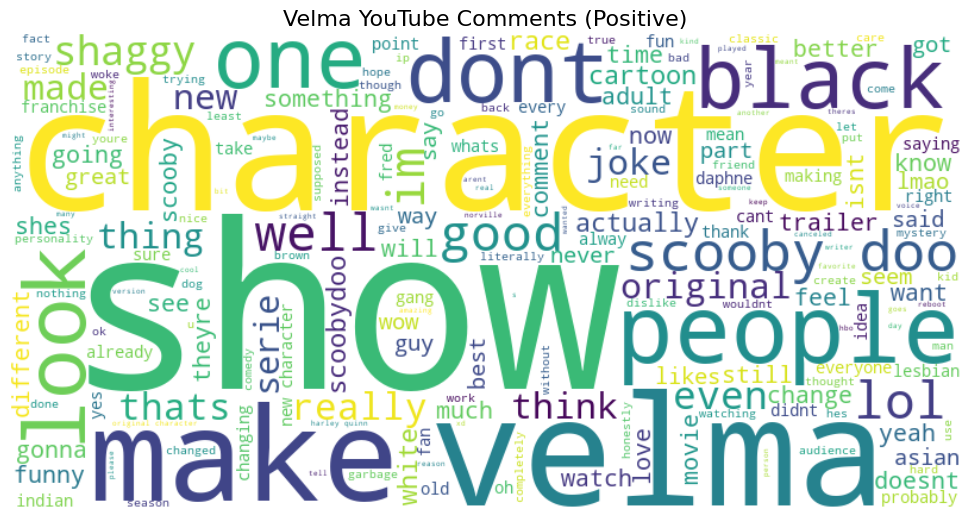

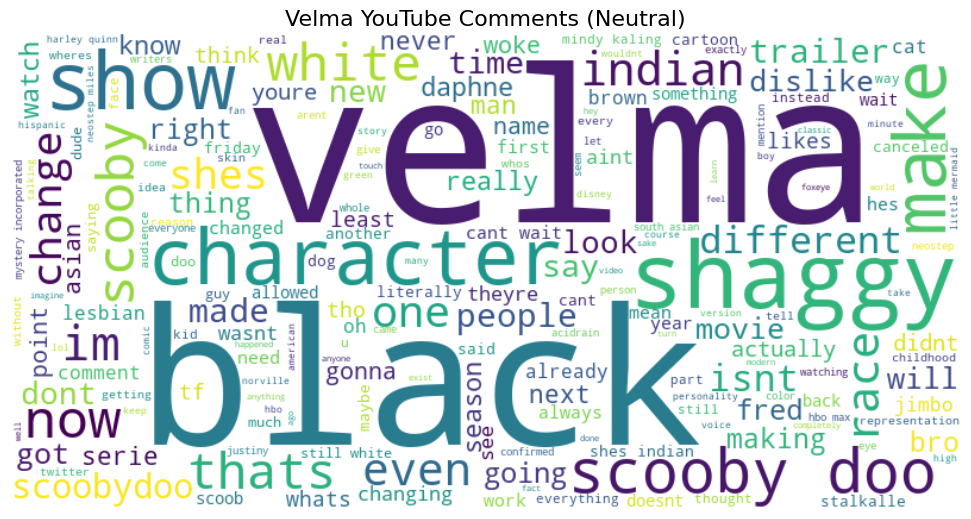

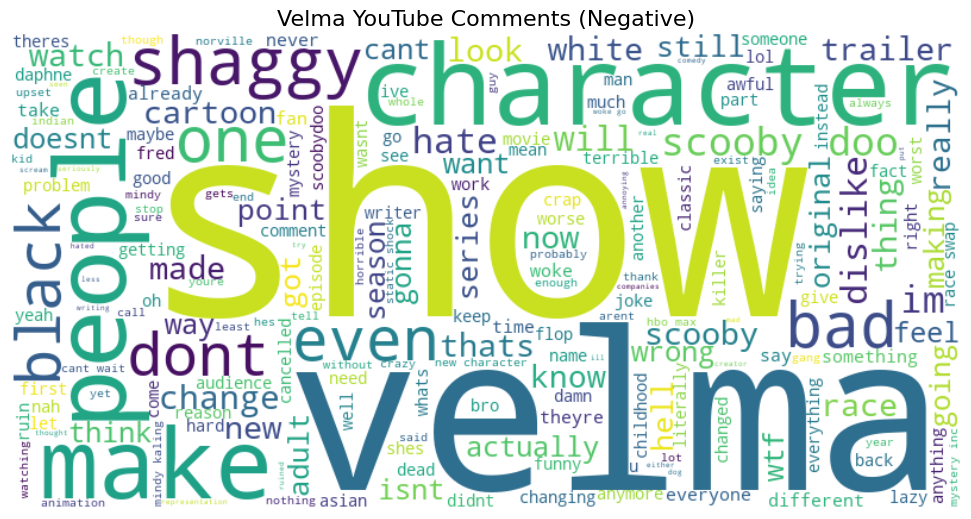

In [75]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import os

# Filter out short comments (optional)
df = df[df['clean_text'].str.split().str.len() > 2]

# Output directory
output_dir = "/Users/johngrier/SSS/Assets/WordClouds"
os.makedirs(output_dir, exist_ok=True)

# Word cloud function
def save_wordcloud(text, sentiment_label):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(" ".join(text))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Velma YouTube Comments ({sentiment_label.title()})", fontsize=16)
    plt.tight_layout(pad=0)

    filename = os.path.join(output_dir, f"velma_wordcloud_{sentiment_label}.png")
    plt.savefig(filename, bbox_inches="tight")
    plt.show()

# Create and save word clouds for each sentiment
for sentiment in ['positive', 'neutral', 'negative']:
    subset = df[df["sentiment_label"] == sentiment]["clean_text"]
    save_wordcloud(subset, sentiment)

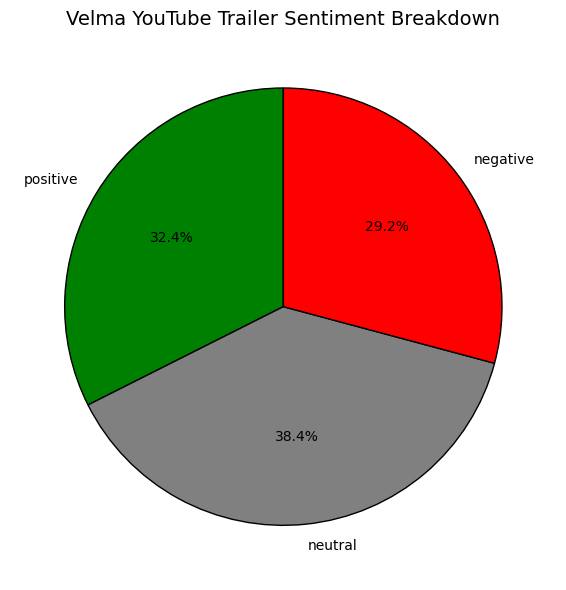

In [76]:
import pandas as pd
import matplotlib.pyplot as plt

# Load processed sentiment
df = pd.read_csv("/Users/johngrier/SSS/Data/Processed/velma_youtube_sentiment_combined.csv")

# Count by sentiment label
sentiment_counts = df["sentiment_label"].value_counts().reindex(["positive", "neutral", "negative"], fill_value=0)

# Plot pie chart
plt.figure(figsize=(6, 6))
sentiment_counts.plot.pie(
    autopct='%1.1f%%',
    colors=["green", "gray", "red"],
    startangle=90,
    label="",
    wedgeprops={'linewidth': 1, 'edgecolor': 'black'}
)

plt.title("Velma YouTube Trailer Sentiment Breakdown", fontsize=14)
plt.tight_layout()
plt.savefig("/Users/johngrier/SSS/Assets/Plots/velma_youtube_sentiment_pie.png", bbox_inches="tight")
plt.show()

In [78]:
import pandas as pd
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Load scraped Reddit data
df = pd.read_csv("/Users/johngrier/SSS/Data/Raw/velma_reddit_comments_s1.csv")

# Clean the comment text
def clean_text(text):
    text = str(text)
    text = re.sub(r"http\S+", "", text)
    text = re.sub(r"[^\w\s]", "", text)
    text = re.sub(r"\d+", "", text)
    return text.lower().strip()

df["clean_text"] = df["text"].apply(clean_text)

# Apply VADER
analyzer = SentimentIntensityAnalyzer()
df["vader_score"] = df["clean_text"].apply(lambda x: analyzer.polarity_scores(x)["compound"])

# Label sentiment
def label_sentiment(score):
    if score >= 0.05:
        return "positive"
    elif score <= -0.05:
        return "negative"
    else:
        return "neutral"

df["sentiment_label"] = df["vader_score"].apply(label_sentiment)

output_path = "/Users/johngrier/SSS/Data/Processed/velma_reddit_sentiment_s1.csv"
df.to_csv(output_path, index=False)
print(f"Cleaned and scored Velma Reddit sentiment saved to: {output_path}")

Cleaned and scored Velma Reddit sentiment saved to: /Users/johngrier/SSS/Data/Processed/velma_reddit_sentiment_s1.csv


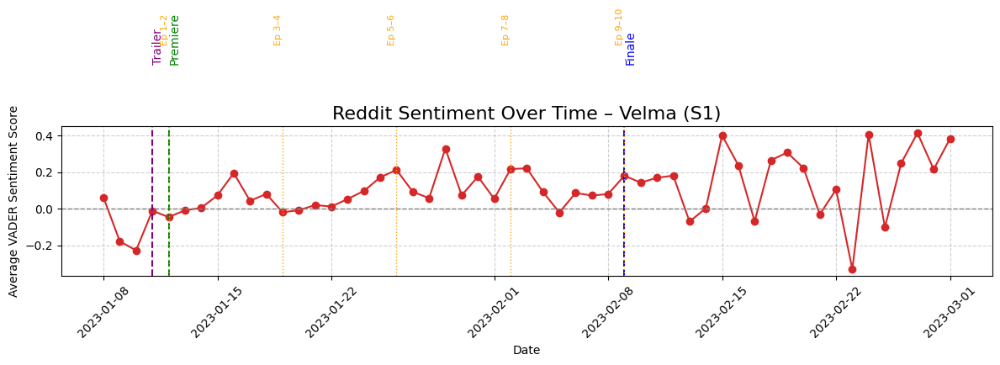

In [79]:
import pandas as pd
import matplotlib.pyplot as plt
from datetime import date

# Load processed Reddit sentiment
df = pd.read_csv("/Users/johngrier/SSS/Data/Processed/velma_reddit_sentiment_s1.csv")
df["date"] = pd.to_datetime(df["date"]).dt.date

# Group by date and compute average sentiment
daily_sentiment = df.groupby("date")["vader_score"].mean().reset_index()

# Plot
plt.figure(figsize=(12, 6))
plt.plot(daily_sentiment["date"], daily_sentiment["vader_score"], marker='o', color='tab:red')
plt.axhline(0, linestyle="--", color="gray", linewidth=1)
plt.title("Reddit Sentiment Over Time – Velma (S1)", fontsize=16)
plt.xlabel("Date")
plt.ylabel("Average VADER Sentiment Score")
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)

# Annotate timeline
plt.axvline(date(2023, 1, 11), color="purple", linestyle="--")
plt.text(date(2023, 1, 11), 0.8, "Trailer", color="purple", rotation=90)

plt.axvline(date(2023, 1, 12), color="green", linestyle="--")
plt.text(date(2023, 1, 12), 0.8, "Premiere", color="green", rotation=90)

plt.axvline(date(2023, 2, 9), color="blue", linestyle="--")
plt.text(date(2023, 2, 9), 0.8, "Finale", color="blue", rotation=90)

# Episode air dates
episodes = {
    "Ep 1–2": date(2023, 1, 12),
    "Ep 3–4": date(2023, 1, 19),
    "Ep 5–6": date(2023, 1, 26),
    "Ep 7–8": date(2023, 2, 2),
    "Ep 9–10": date(2023, 2, 9)
}

# Add episode markers
for ep, d in episodes.items():
    plt.axvline(d, linestyle=":", color="orange", linewidth=1)
    plt.text(d, 0.9, ep, rotation=90, color="orange", fontsize=8, ha='right') 
    
# Save chart
plt.tight_layout()
plt.savefig("/Users/johngrier/SSS/Assets/Plots/velma_reddit_sentiment_trend_s1.png", bbox_inches="tight")
plt.show()

In [80]:
from youtube_comment_downloader import YoutubeCommentDownloader
import pandas as pd

video_id = "DotnJ7tTA34"  # HOTD official trailer

downloader = YoutubeCommentDownloader()
comments = []

for comment in downloader.get_comments_from_url(f"https://www.youtube.com/watch?v={video_id}", sort_by=0):
    comments.append({
        "text": comment["text"],
        "time": comment["time"],
        "author": comment["author"],
        "votes": comment["votes"],
        "timestamp": comment["time_parsed"]
    })

# Save to CSV
df = pd.DataFrame(comments)
df.to_csv("/Users/johngrier/SSS/Data/Raw/hotd_youtube_comments_s1.csv", index=False)

print(f"Scraped {len(df)} YouTube comments from HOTD trailer.")

Scraped 4610 YouTube comments from HOTD trailer.


In [82]:
import pandas as pd
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Load scraped YouTube comments
df = pd.read_csv("/Users/johngrier/SSS/Data/Raw/hotd_youtube_comments_s1.csv")

# Clean comment text
def clean_text(text):
    text = str(text)
    text = re.sub(r"http\S+", "", text)
    text = re.sub(r"[^\w\s]", "", text)
    text = re.sub(r"\d+", "", text)
    return text.lower().strip()

df["clean_text"] = df["text"].apply(clean_text)

# Apply VADER
analyzer = SentimentIntensityAnalyzer()
df["vader_score"] = df["clean_text"].apply(lambda x: analyzer.polarity_scores(x)["compound"])

# Label sentiment
def label_sentiment(score):
    if score >= 0.05:
        return "positive"
    elif score <= -0.05:
        return "negative"
    else:
        return "neutral"

df["sentiment_label"] = df["vader_score"].apply(label_sentiment)

output_path = "/Users/johngrier/SSS/Data/Processed/hotd_youtube_sentiment_s1.csv"
df.to_csv(output_path, index=False)
print(f"Saved processed sentiment to: {output_path}")

Saved processed sentiment to: /Users/johngrier/SSS/Data/Processed/hotd_youtube_sentiment_s1.csv


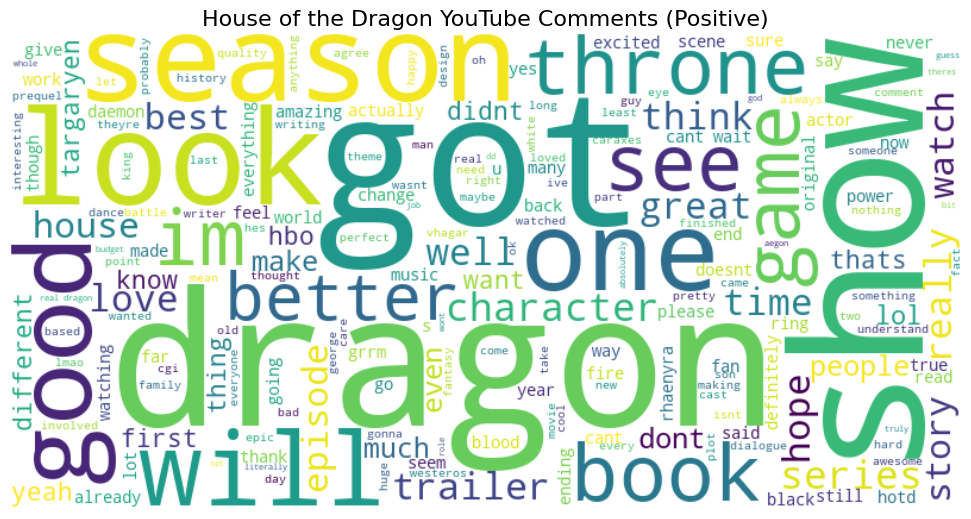

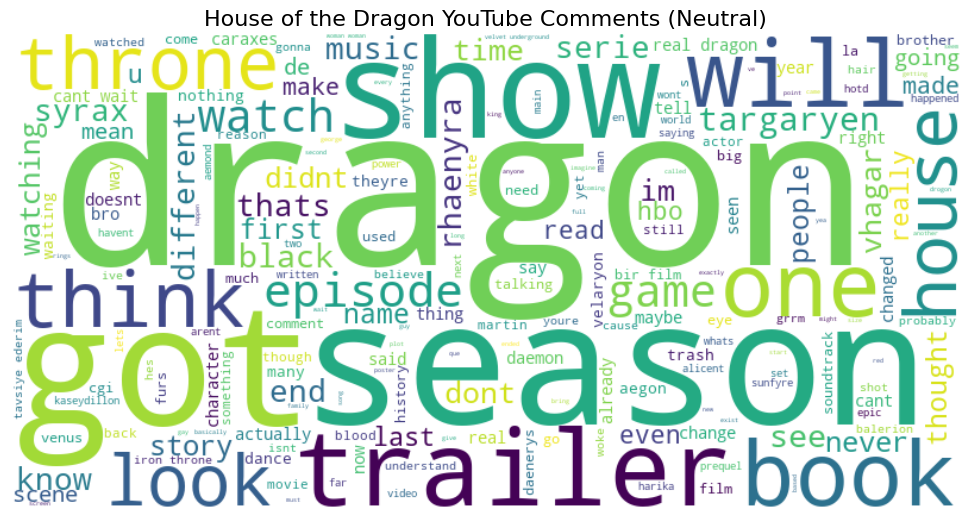

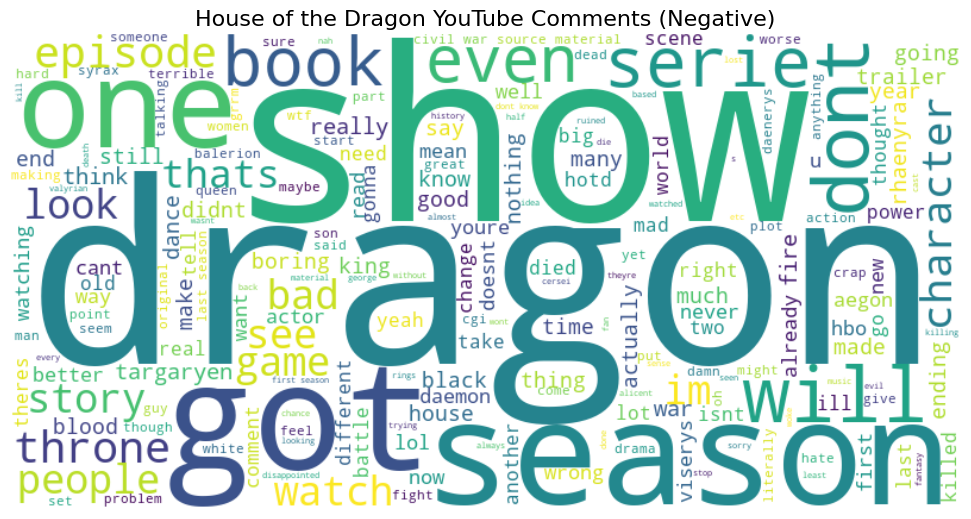

In [83]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import os

df = df[df['clean_text'].str.split().str.len() > 2]  # filter short comments
output_dir = "/Users/johngrier/SSS/Assets/WordClouds"
os.makedirs(output_dir, exist_ok=True)

def save_wordcloud(text, sentiment_label):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(" ".join(text))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"House of the Dragon YouTube Comments ({sentiment_label.title()})", fontsize=16)
    plt.tight_layout(pad=0)
    filename = os.path.join(output_dir, f"hotd_wordcloud_{sentiment_label}.png")
    plt.savefig(filename, bbox_inches="tight")
    plt.show()

for sentiment in ['positive', 'neutral', 'negative']:
    subset = df[df["sentiment_label"] == sentiment]["clean_text"]
    save_wordcloud(subset, sentiment)

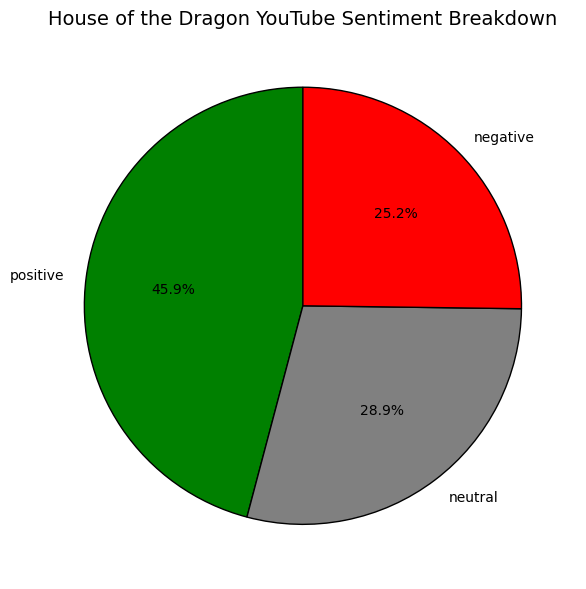

In [84]:
sentiment_counts = df["sentiment_label"].value_counts().reindex(["positive", "neutral", "negative"], fill_value=0)

plt.figure(figsize=(6, 6))
sentiment_counts.plot.pie(
    autopct='%1.1f%%',
    colors=["green", "gray", "red"],
    startangle=90,
    label="",
    wedgeprops={'linewidth': 1, 'edgecolor': 'black'}
)

plt.title("House of the Dragon YouTube Sentiment Breakdown", fontsize=14)
plt.tight_layout()
plt.savefig("/Users/johngrier/SSS/Assets/Plots/hotd_youtube_sentiment_pie.png", bbox_inches="tight")
plt.show()

In [87]:
import praw
import pandas as pd
from datetime import datetime

# Reddit API credentials
reddit = praw.Reddit(
    client_id="YOUR_CLIENT_ID",
    client_secret="YOUR_CLIENT_SECRET",
    user_agent="sentiment analysis script by /u/yourusername"
)

# Time window
start_date = int(datetime(2022, 7, 1).timestamp())
end_date = int(datetime(2022, 11, 1).timestamp())

# Subreddits
subreddits = ["HouseOfTheDragon", "television", "gameofthrones"]
query = "house of the dragon"

results = []

for sub in subreddits:
    for submission in reddit.subreddit(sub).search(query, sort="new", limit=1000):
        submission.comments.replace_more(limit=0)
        for comment in submission.comments:
            try:
                results.append({
                    "text": comment.body,
                    "created_utc": comment.created_utc,
                    "subreddit": sub,
                    "score": comment.score
                })
            except AttributeError:
                continue

# Save raw scraped file
df = pd.DataFrame(results)
df["date"] = pd.to_datetime(df["created_utc"], unit="s")
df.to_csv("/Users/johngrier/SSS/Data/Raw/hotd_reddit_comments_s1.csv", index=False)

print(f"Scraped {len(df)} Reddit comments for House of the Dragon (S1).")

Scraped 17230 Reddit comments for House of the Dragon (S1).


In [88]:
import pandas as pd
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Load scraped data
df = pd.read_csv("/Users/johngrier/SSS/Data/Raw/hotd_reddit_comments_s1.csv")

# Clean text
def clean_text(text):
    text = str(text)
    text = re.sub(r"http\S+", "", text)
    text = re.sub(r"[^\w\s]", "", text)
    text = re.sub(r"\d+", "", text)
    return text.lower().strip()

df["clean_text"] = df["text"].apply(clean_text)

# Apply VADER
analyzer = SentimentIntensityAnalyzer()
df["vader_score"] = df["clean_text"].apply(lambda x: analyzer.polarity_scores(x)["compound"])

# Label sentiment
def label_sentiment(score):
    if score >= 0.05:
        return "positive"
    elif score <= -0.05:
        return "negative"
    else:
        return "neutral"

df["sentiment_label"] = df["vader_score"].apply(label_sentiment)

output_path = "/Users/johngrier/SSS/Data/Processed/hotd_reddit_sentiment_s1.csv"
df.to_csv(output_path, index=False)
print(f"Saved cleaned and scored HOTD Reddit sentiment to: {output_path}")

Saved cleaned and scored HOTD Reddit sentiment to: /Users/johngrier/SSS/Data/Processed/hotd_reddit_sentiment_s1.csv


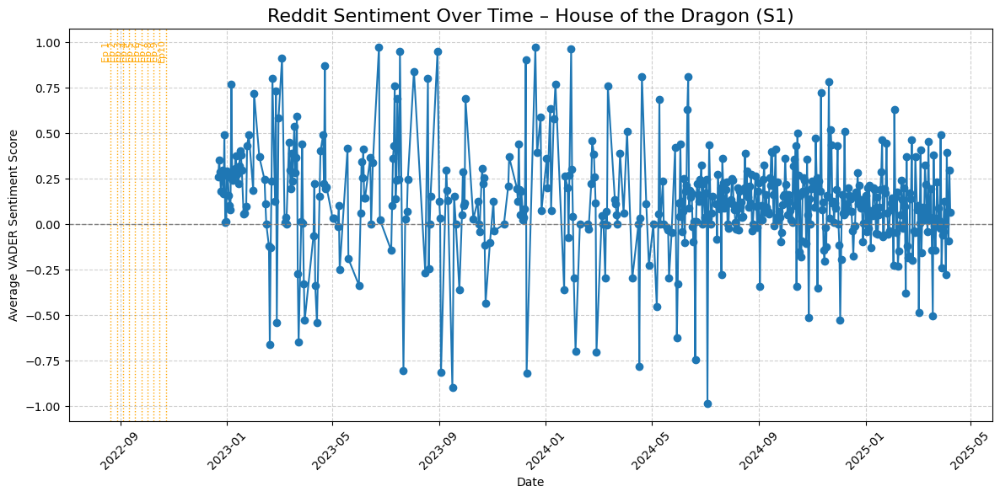

In [89]:
import pandas as pd
import matplotlib.pyplot as plt
from datetime import date

# Load processed data
df = pd.read_csv("/Users/johngrier/SSS/Data/Processed/hotd_reddit_sentiment_s1.csv")
df["date"] = pd.to_datetime(df["date"]).dt.date

# Group by day and compute average sentiment
daily_sentiment = df.groupby("date")["vader_score"].mean().reset_index()

# Plot
plt.figure(figsize=(12, 6))
plt.plot(daily_sentiment["date"], daily_sentiment["vader_score"], marker='o', color='tab:blue')
plt.axhline(0, linestyle="--", color="gray", linewidth=1)
plt.title("Reddit Sentiment Over Time – House of the Dragon (S1)", fontsize=16)
plt.xlabel("Date")
plt.ylabel("Average VADER Sentiment Score")
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)

# Annotate episode drops
episodes = {
    "Ep 1": date(2022, 8, 21),
    "Ep 2": date(2022, 8, 28),
    "Ep 3": date(2022, 9, 4),
    "Ep 4": date(2022, 9, 11),
    "Ep 5": date(2022, 9, 18),
    "Ep 6": date(2022, 9, 25),
    "Ep 7": date(2022, 10, 2),
    "Ep 8": date(2022, 10, 9),
    "Ep 9": date(2022, 10, 16),
    "Ep10": date(2022, 10, 23)
}

for ep, d in episodes.items():
    plt.axvline(d, linestyle=":", color="orange", linewidth=1)
    plt.text(d, 0.9, ep, rotation=90, color="orange", fontsize=8, ha='right')

# Save the chart
plt.tight_layout()
plt.savefig("/Users/johngrier/SSS/Assets/Plots/hotd_reddit_sentiment_trend_s1.png", bbox_inches="tight")
plt.show()

In [92]:
from youtube_comment_downloader import YoutubeCommentDownloader
import pandas as pd

downloader = YoutubeCommentDownloader()
all_comments = []

video_ids = {
    "FX": "_KLsZVMbu8U",
    "DisneyPlus": "ao6WruD0ClQ",
    "RottenTomatoes": "utq_LQKjZrA"
}

for label, vid in video_ids.items():
    print(f"Scraping comments for {label}...")
    for comment in downloader.get_comments_from_url(f"https://www.youtube.com/watch?v={vid}", sort_by=0):
        all_comments.append({
            "source": label,
            "text": comment["text"],
            "time": comment["time"],
            "author": comment["author"],
            "votes": comment["votes"],
            "timestamp": comment["time_parsed"]
        })

# Save all scraped comments
df = pd.DataFrame(all_comments)
df.to_csv("/Users/johngrier/SSS/Data/Raw/the_bear_youtube_comments_combined.csv", index=False)

print(f"Scraped {len(df)} comments from all The Bear Season 2 trailers.")

Scraping comments for FX...
Scraping comments for DisneyPlus...
Scraping comments for RottenTomatoes...
Scraped 63 comments from all The Bear Season 2 trailers.


In [93]:
import pandas as pd
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Load combined YouTube data
df = pd.read_csv("/Users/johngrier/SSS/Data/Raw/the_bear_youtube_comments_combined.csv")

# Clean the comment text
def clean_text(text):
    text = str(text)
    text = re.sub(r"http\S+", "", text)
    text = re.sub(r"[^\w\s]", "", text)
    text = re.sub(r"\d+", "", text)
    return text.lower().strip()

df["clean_text"] = df["text"].apply(clean_text)

# VADER scoring
analyzer = SentimentIntensityAnalyzer()
df["vader_score"] = df["clean_text"].apply(lambda x: analyzer.polarity_scores(x)["compound"])

# Sentiment label
def label_sentiment(score):
    if score >= 0.05:
        return "positive"
    elif score <= -0.05:
        return "negative"
    else:
        return "neutral"

df["sentiment_label"] = df["vader_score"].apply(label_sentiment)

# Save it
output_path = "/Users/johngrier/SSS/Data/Processed/the_bear_youtube_sentiment_combined.csv"
df.to_csv(output_path, index=False)
print(f"Saved processed sentiment data to: {output_path}")

Saved processed sentiment data to: /Users/johngrier/SSS/Data/Processed/the_bear_youtube_sentiment_combined.csv


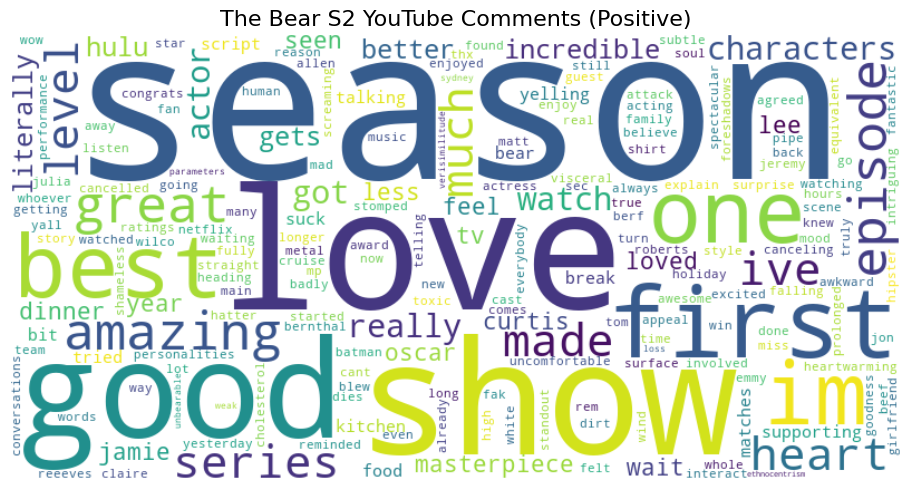

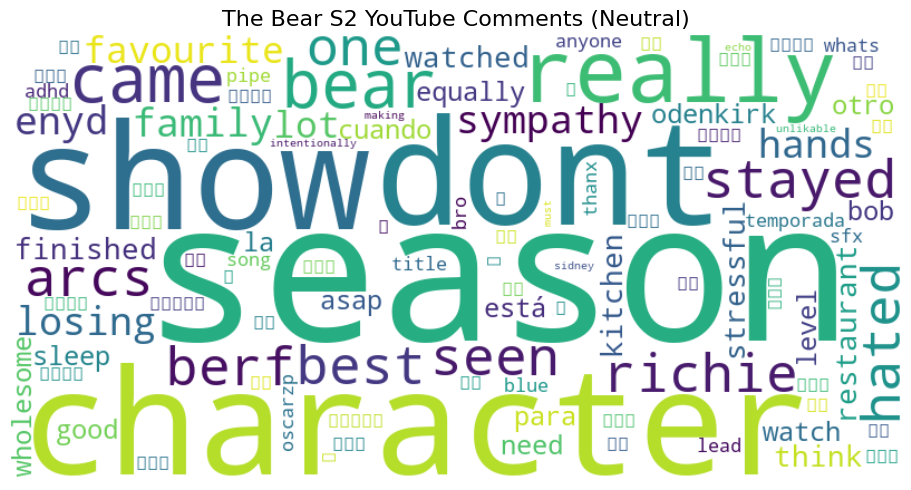

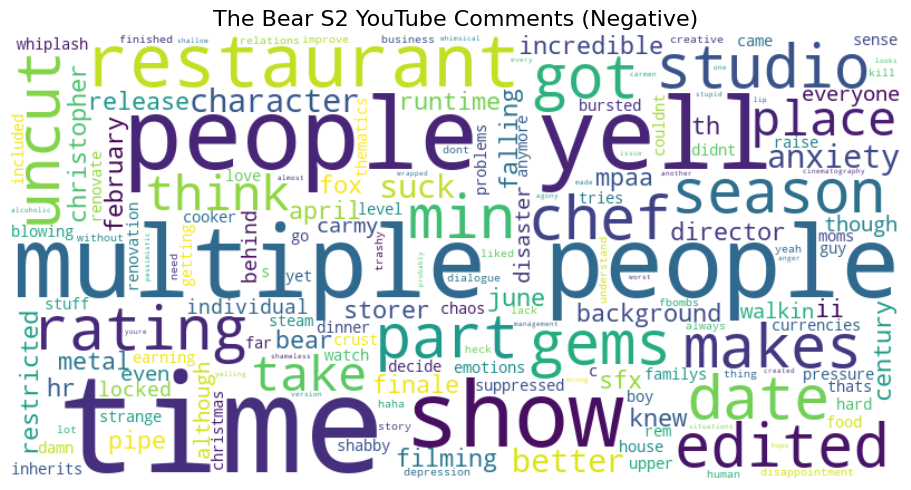

In [94]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import os

# Optional: filter short comments
df = df[df['clean_text'].str.split().str.len() > 2]

output_dir = "/Users/johngrier/SSS/Assets/WordClouds"
os.makedirs(output_dir, exist_ok=True)

def save_wordcloud(text, sentiment_label):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(" ".join(text))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"The Bear S2 YouTube Comments ({sentiment_label.title()})", fontsize=16)
    plt.tight_layout()
    filename = os.path.join(output_dir, f"the_bear_wordcloud_{sentiment_label}.png")
    plt.savefig(filename, bbox_inches="tight")
    plt.show()

for sentiment in ['positive', 'neutral', 'negative']:
    subset = df[df["sentiment_label"] == sentiment]["clean_text"]
    save_wordcloud(subset, sentiment)

In [99]:
import praw
import pandas as pd
from datetime import datetime

# Reddit credentials
reddit = praw.Reddit(
    client_id="YOUR_CLIENT_ID",
    client_secret="YOUR_CLIENT_SECRET",
    user_agent="sentiment analysis script by /u/yourusername"
)

# Time window: June–August 2023
start_date = int(datetime(2023, 6, 1).timestamp())
end_date = int(datetime(2023, 10, 1).timestamp())

subreddits = ["TheBear", "television", "Hulu"]
query = "the bear"

results = []

for sub in subreddits:
    for submission in reddit.subreddit(sub).search(query, sort="new", limit=1000):
        submission.comments.replace_more(limit=0)
        for comment in submission.comments:
            try:
                if start_date <= comment.created_utc <= end_date:
                    results.append({
                        "text": comment.body,
                        "created_utc": comment.created_utc,
                        "subreddit": sub,
                        "score": comment.score
                    })
            except AttributeError:
                continue

# Save scraped comments
df = pd.DataFrame(results)
df["date"] = pd.to_datetime(df["created_utc"], unit="s")
df.to_csv("/Users/johngrier/SSS/Data/Raw/the_bear_reddit_comments_s2.csv", index=False)

print(f"Scraped {len(df)} Reddit comments for The Bear S2.")

Scraped 31 Reddit comments for The Bear S2.


In [100]:
import pandas as pd
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Load Reddit data
df = pd.read_csv("/Users/johngrier/SSS/Data/Raw/the_bear_reddit_comments_s2.csv")

# Clean comment text
def clean_text(text):
    text = str(text)
    text = re.sub(r"http\S+", "", text)
    text = re.sub(r"[^\w\s]", "", text)
    text = re.sub(r"\d+", "", text)
    return text.lower().strip()

df["clean_text"] = df["text"].apply(clean_text)

# VADER scoring
analyzer = SentimentIntensityAnalyzer()
df["vader_score"] = df["clean_text"].apply(lambda x: analyzer.polarity_scores(x)["compound"])

# Sentiment labeling
def label_sentiment(score):
    if score >= 0.05:
        return "positive"
    elif score <= -0.05:
        return "negative"
    else:
        return "neutral"

df["sentiment_label"] = df["vader_score"].apply(label_sentiment)

output_path = "/Users/johngrier/SSS/Data/Processed/the_bear_reddit_sentiment_s2.csv"
df.to_csv(output_path, index=False)
print(f"Saved processed sentiment to: {output_path}")

Saved processed sentiment to: /Users/johngrier/SSS/Data/Processed/the_bear_reddit_sentiment_s2.csv


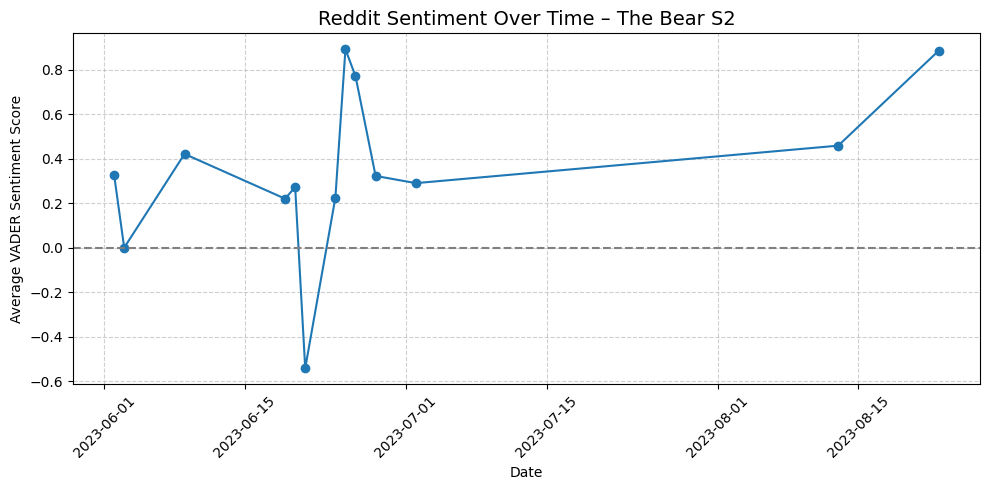

In [101]:
import matplotlib.pyplot as plt
from datetime import date

# Convert and group by day
df["date"] = pd.to_datetime(df["date"]).dt.date
daily_sentiment = df.groupby("date")["vader_score"].mean().reset_index()

# Plot
plt.figure(figsize=(10, 5))
plt.plot(daily_sentiment["date"], daily_sentiment["vader_score"], marker='o', color='tab:blue')
plt.axhline(0, linestyle="--", color="gray")
plt.title("Reddit Sentiment Over Time – The Bear S2", fontsize=14)
plt.xlabel("Date")
plt.ylabel("Average VADER Sentiment Score")
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig("/Users/johngrier/SSS/Assets/Plots/the_bear_reddit_sentiment_trend_s2.png", bbox_inches="tight")
plt.show()

In [102]:
import praw
import pandas as pd
from datetime import datetime

# Reddit API setup
reddit = praw.Reddit(
    client_id="YOUR_CLIENT_ID",
    client_secret="YOUR_CLIENT_SECRET",
    user_agent="sentiment analysis script by /u/yourusername"
)

# List of Season 3 discussion thread URLs
submission_urls = [
    "https://www.reddit.com/r/TheBear/comments/1dpeqe5/the_bear_season_3_overall_season_discussion_thread/",
    "https://www.reddit.com/r/TheBear/comments/1dpeqdv/the_bear_s3e10_forever_episode_discussion/",
    "https://www.reddit.com/r/TheBear/comments/1dpeqdf/the_bear_s3e8_ice_chips_episode_discussion/",
    "https://www.reddit.com/r/TheBear/comments/1dpeqdk/the_bear_s3e9_apologies_episode_discussion/",
    "https://www.reddit.com/r/TheBear/comments/1dpeqcf/the_bear_s3e3_doors_episode_discussion/",
    "https://www.reddit.com/r/TheBear/comments/1dpeqcl/the_bear_s3e4_violet_episode_discussion/",
    "https://www.reddit.com/r/TheBear/comments/1dpeqcs/the_bear_s3e5_children_episode_discussion/",
    "https://www.reddit.com/r/TheBear/comments/1dpeqd1/the_bear_s3e6_napkins_episode_discussion/",
    "https://www.reddit.com/r/TheBear/comments/1dpeqda/the_bear_s3e7_legacy_episode_discussion/",
    "https://www.reddit.com/r/TheBear/comments/1dpeqa1/the_bear_s3e1_tomorrow_episode_discussion/",
    "https://www.reddit.com/r/TheBear/comments/1dpeqc8/the_bear_s3e2_next_episode_discussion/"
]

results = []

for url in submission_urls:
    submission = reddit.submission(url=url)
    submission.comments.replace_more(limit=0)  # Expand all replies
    for comment in submission.comments.list():  # Flatten all comment levels
        try:
            results.append({
                "text": comment.body,
                "created_utc": comment.created_utc,
                "subreddit": submission.subreddit.display_name,
                "score": comment.score,
                "thread_title": submission.title,
                "url": url
            })
        except AttributeError:
            continue

# Save to CSV
df = pd.DataFrame(results)
df["date"] = pd.to_datetime(df["created_utc"], unit="s")
df.to_csv("/Users/johngrier/SSS/Data/Raw/the_bear_reddit_comments_s3_threads.csv", index=False)

print(f"Scraped {len(df)} comments and replies from S3 discussion threads.")

Scraped 5441 comments and replies from S3 discussion threads.


In [103]:
import pandas as pd
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Load scraped comments
df = pd.read_csv("/Users/johngrier/SSS/Data/Raw/the_bear_reddit_comments_s3_threads.csv")

# Clean the comment text
def clean_text(text):
    text = str(text)
    text = re.sub(r"http\S+", "", text)
    text = re.sub(r"[^\w\s]", "", text)
    text = re.sub(r"\d+", "", text)
    return text.lower().strip()

df["clean_text"] = df["text"].apply(clean_text)

# Apply VADER
analyzer = SentimentIntensityAnalyzer()
df["vader_score"] = df["clean_text"].apply(lambda x: analyzer.polarity_scores(x)["compound"])

# Label sentiment
def label_sentiment(score):
    if score >= 0.05:
        return "positive"
    elif score <= -0.05:
        return "negative"
    else:
        return "neutral"

df["sentiment_label"] = df["vader_score"].apply(label_sentiment)

output_path = "/Users/johngrier/SSS/Data/Processed/the_bear_reddit_sentiment_s3.csv"
df.to_csv(output_path, index=False)
print(f"Cleaned and scored sentiment saved to: {output_path}")

Cleaned and scored sentiment saved to: /Users/johngrier/SSS/Data/Processed/the_bear_reddit_sentiment_s3.csv


<Figure size 1400x700 with 0 Axes>

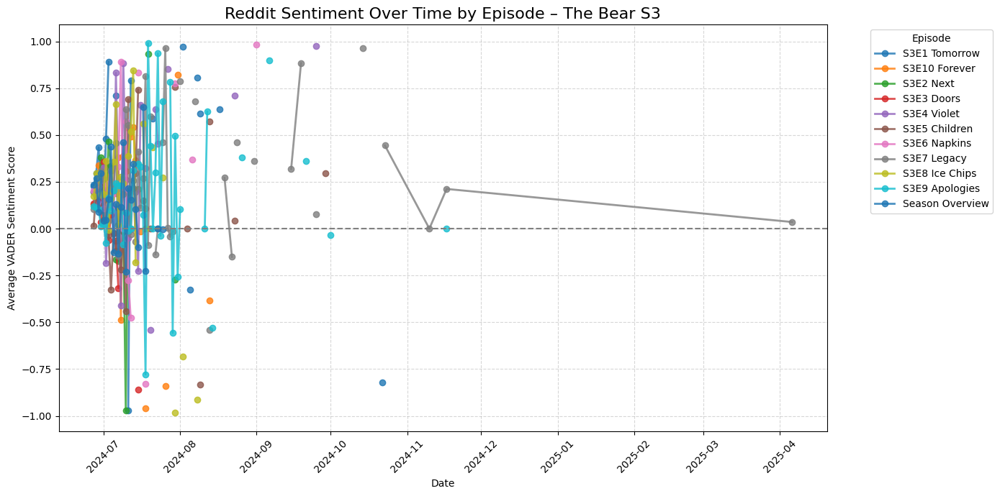

In [107]:
import pandas as pd
import re
import matplotlib.pyplot as plt

# Load processed data
df = pd.read_csv("/Users/johngrier/SSS/Data/Processed/the_bear_reddit_sentiment_s3.csv")
df["date"] = pd.to_datetime(df["date"]).dt.date

def extract_episode_title(title):
    match = re.search(r"S3E\d+\s\"([^\"]+)\"", title)
    ep_code = re.search(r"S3E\d+", title)
    if match and ep_code:
        return f"{ep_code.group()} {match.group(1)}"
    elif "Overall Season" in title:
        return "Season Overview"
    else:
        return None

df["episode"] = df["thread_title"].apply(extract_episode_title)

# Clean up episode titles (optional: shorter formatting)
episode_sentiment = df.groupby("episode")["vader_score"].mean().reset_index()

# Group by episode + date
daily_by_episode = df.groupby(["episode", "date"])["vader_score"].mean().reset_index()

# Pivot for plotting
pivot = daily_by_episode.pivot(index="date", columns="episode", values="vader_score")

# Plot
plt.figure(figsize=(14, 7))
pivot.plot(marker='o', linewidth=2, figsize=(14, 7), alpha=0.8)

plt.axhline(0, linestyle="--", color="gray")
plt.title("Reddit Sentiment Over Time by Episode – The Bear S3", fontsize=16)
plt.xlabel("Date")
plt.ylabel("Average VADER Sentiment Score")
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.5)
plt.legend(title="Episode", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig("/Users/johngrier/SSS/Assets/Plots/the_bear_reddit_sentiment_by_episode_overtime_s3.png", bbox_inches="tight")
plt.show()

In [109]:
from youtube_comment_downloader import YoutubeCommentDownloader
import pandas as pd

video_id = "h-2LIjOt0rA"  # Netflix title reveal

downloader = YoutubeCommentDownloader()
comments = []

for comment in downloader.get_comments_from_url(f"https://www.youtube.com/watch?v={video_id}", sort_by=0):
    comments.append({
        "source": "Netflix_TitleReveal",
        "text": comment["text"],
        "time": comment["time"],
        "author": comment["author"],
        "votes": comment["votes"],
        "timestamp": comment["time_parsed"]
    })

# Save
df = pd.DataFrame(comments)
df.to_csv("/Users/johngrier/SSS/Data/Raw/stranger_things_s5_youtube_comments_title_reveal.csv", index=False)

print(f"Scraped {len(df)} comments from the Stranger Things 5 title reveal.")

Scraped 2430 comments from the Stranger Things 5 title reveal.


In [110]:
import pandas as pd
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Load scraped YouTube comments
df = pd.read_csv("/Users/johngrier/SSS/Data/Raw/stranger_things_s5_youtube_comments_title_reveal.csv")

# Clean comment text
def clean_text(text):
    text = str(text)
    text = re.sub(r"http\S+", "", text)
    text = re.sub(r"[^\w\s]", "", text)
    text = re.sub(r"\d+", "", text)
    return text.lower().strip()

df["clean_text"] = df["text"].apply(clean_text)

# Apply VADER sentiment
analyzer = SentimentIntensityAnalyzer()
df["vader_score"] = df["clean_text"].apply(lambda x: analyzer.polarity_scores(x)["compound"])

# Label sentiment
def label_sentiment(score):
    if score >= 0.05:
        return "positive"
    elif score <= -0.05:
        return "negative"
    else:
        return "neutral"

df["sentiment_label"] = df["vader_score"].apply(label_sentiment)

output_path = "/Users/johngrier/SSS/Data/Processed/stranger_things_s5_youtube_sentiment_title_reveal.csv"
df.to_csv(output_path, index=False)
print(f"Saved processed sentiment data to: {output_path}")

Saved processed sentiment data to: /Users/johngrier/SSS/Data/Processed/stranger_things_s5_youtube_sentiment_title_reveal.csv


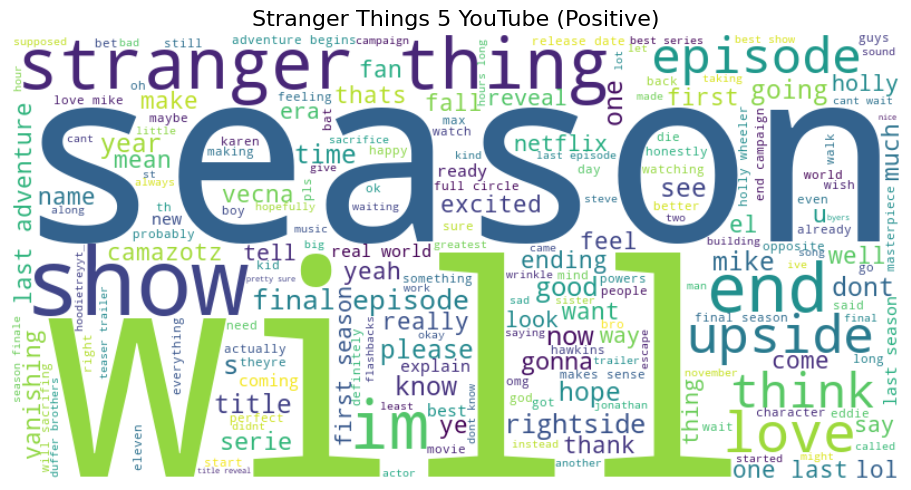

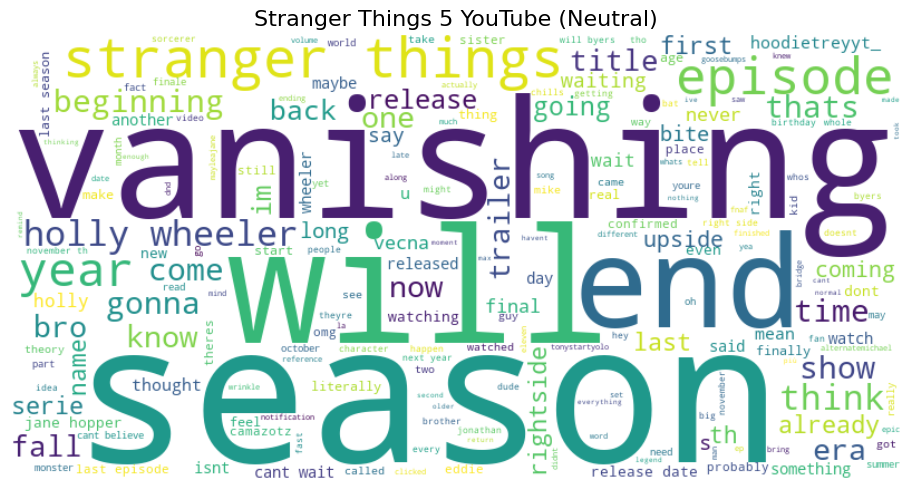

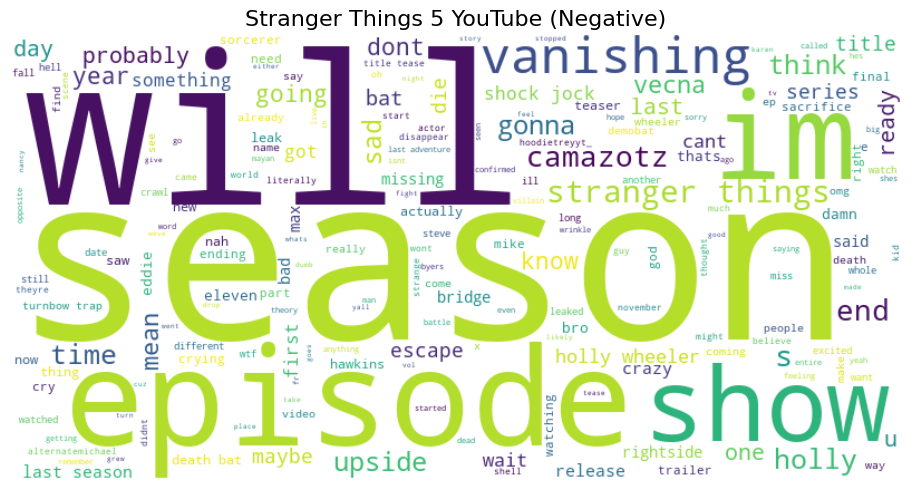

In [111]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import os

# Filter out very short comments
df = df[df['clean_text'].str.split().str.len() > 2]

# Output path
output_dir = "/Users/johngrier/SSS/Assets/WordClouds"
os.makedirs(output_dir, exist_ok=True)

# Function to generate and save each word cloud
def save_wordcloud(text, sentiment_label):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(" ".join(text))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Stranger Things 5 YouTube ({sentiment_label.title()})", fontsize=16)
    plt.tight_layout()
    
    filename = os.path.join(output_dir, f"stranger_things_s5_wordcloud_{sentiment_label}.png")
    plt.savefig(filename, bbox_inches="tight")
    plt.show()

# Generate all 3 clouds
for sentiment in ['positive', 'neutral', 'negative']:
    subset = df[df["sentiment_label"] == sentiment]["clean_text"]
    save_wordcloud(subset, sentiment)

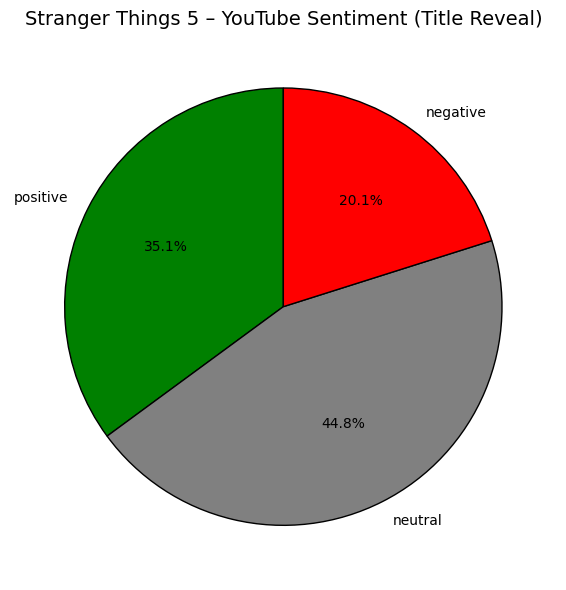

In [112]:
# Count by sentiment
sentiment_counts = df["sentiment_label"].value_counts().reindex(["positive", "neutral", "negative"], fill_value=0)

# Plot
plt.figure(figsize=(6, 6))
sentiment_counts.plot.pie(
    autopct='%1.1f%%',
    colors=["green", "gray", "red"],
    startangle=90,
    label="",
    wedgeprops={'linewidth': 1, 'edgecolor': 'black'}
)
plt.title("Stranger Things 5 – YouTube Sentiment (Title Reveal)", fontsize=14)
plt.tight_layout()
plt.savefig("/Users/johngrier/SSS/Assets/Plots/stranger_things_s5_youtube_sentiment_pie.png", bbox_inches="tight")
plt.show()

In [113]:
import praw
import pandas as pd
from datetime import datetime

# Reddit API setup
reddit = praw.Reddit(
    client_id="YOUR_CLIENT_ID",
    client_secret="YOUR_CLIENT_SECRET",
    user_agent="sentiment analysis script by /u/yourusername"
)

# Date range: Oct 1, 2023 – Present
start_date = int(datetime(2023, 10, 1).timestamp())
end_date = int(datetime.now().timestamp())

subreddits = ["StrangerThings", "television", "netflix"]
query = "stranger things 5"

results = []

for sub in subreddits:
    for submission in reddit.subreddit(sub).search(query, sort="new", limit=1000):
        submission.comments.replace_more(limit=0)
        for comment in submission.comments:
            try:
                if start_date <= comment.created_utc <= end_date:
                    results.append({
                        "text": comment.body,
                        "created_utc": comment.created_utc,
                        "subreddit": sub,
                        "score": comment.score
                    })
            except AttributeError:
                continue

# Save
df = pd.DataFrame(results)
df["date"] = pd.to_datetime(df["created_utc"], unit="s")
df.to_csv("/Users/johngrier/SSS/Data/Raw/stranger_things_s5_reddit_comments.csv", index=False)

print(f"Scraped {len(df)} Reddit comments for Stranger Things S5.")

Scraped 16531 Reddit comments for Stranger Things S5.


In [114]:
import pandas as pd
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Load Reddit data
df = pd.read_csv("/Users/johngrier/SSS/Data/Raw/stranger_things_s5_reddit_comments.csv")

# Clean text
def clean_text(text):
    text = str(text)
    text = re.sub(r"http\S+", "", text)
    text = re.sub(r"[^\w\s]", "", text)
    text = re.sub(r"\d+", "", text)
    return text.lower().strip()

df["clean_text"] = df["text"].apply(clean_text)

# VADER scoring
analyzer = SentimentIntensityAnalyzer()
df["vader_score"] = df["clean_text"].apply(lambda x: analyzer.polarity_scores(x)["compound"])

# Sentiment label
def label_sentiment(score):
    if score >= 0.05:
        return "positive"
    elif score <= -0.05:
        return "negative"
    else:
        return "neutral"

df["sentiment_label"] = df["vader_score"].apply(label_sentiment)

output_path = "/Users/johngrier/SSS/Data/Processed/stranger_things_s5_reddit_sentiment.csv"
df.to_csv(output_path, index=False)
print(f"Saved ST5 Reddit sentiment to: {output_path}")

Saved ST5 Reddit sentiment to: /Users/johngrier/SSS/Data/Processed/stranger_things_s5_reddit_sentiment.csv


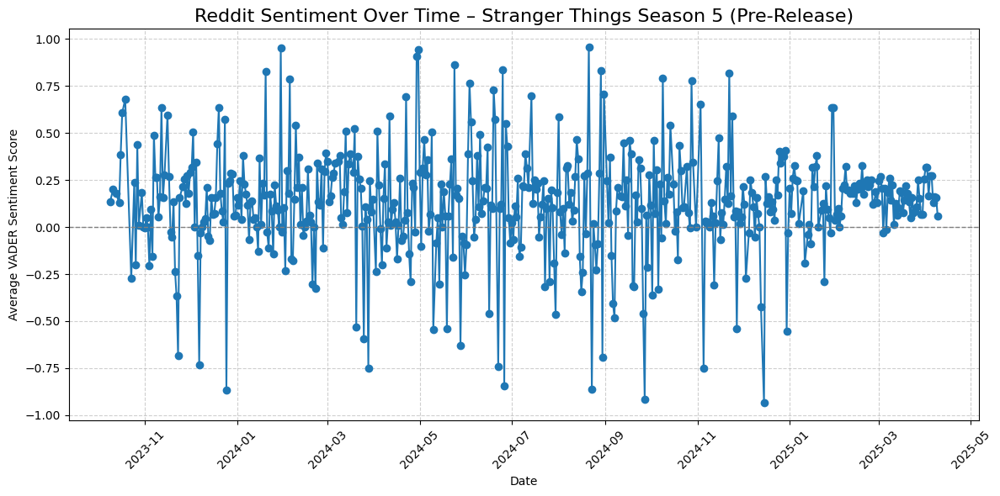

In [115]:
import matplotlib.pyplot as plt
from datetime import date

# Load the scored Reddit data
df = pd.read_csv("/Users/johngrier/SSS/Data/Processed/stranger_things_s5_reddit_sentiment.csv")
df["date"] = pd.to_datetime(df["date"]).dt.date

# Group by day and compute average sentiment
daily_sentiment = df.groupby("date")["vader_score"].mean().reset_index()

# Plot
plt.figure(figsize=(12, 6))
plt.plot(daily_sentiment["date"], daily_sentiment["vader_score"], marker='o', color='tab:blue')
plt.axhline(0, linestyle="--", color="gray", linewidth=1)
plt.title("Reddit Sentiment Over Time – Stranger Things Season 5 (Pre-Release)", fontsize=16)
plt.xlabel("Date")
plt.ylabel("Average VADER Sentiment Score")
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)

# Optional: Annotate key milestones if known
# Example:
# plt.axvline(date(2023, 11, 6), color="green", linestyle="--")
# plt.text(date(2023, 11, 6), 0.8, "ST Day", color="green", rotation=90)

# Save
plt.tight_layout()
plt.savefig("/Users/johngrier/SSS/Assets/Plots/stranger_things_s5_reddit_sentiment_trend.png", bbox_inches="tight")
plt.show()


In [117]:
from youtube_comment_downloader import YoutubeCommentDownloader
import pandas as pd

video_id = "_zHPsmXCjB0"  # Fan trailer from Screen Culture

downloader = YoutubeCommentDownloader()
comments = []

for comment in downloader.get_comments_from_url(f"https://www.youtube.com/watch?v={video_id}", sort_by=0):
    comments.append({
        "source": "ScreenCulture_FanTrailer",
        "text": comment["text"],
        "time": comment["time"],
        "author": comment["author"],
        "votes": comment["votes"],
        "timestamp": comment["time_parsed"]
    })

# Save
df = pd.DataFrame(comments)
df.to_csv("/Users/johngrier/SSS/Data/Raw/last_of_us_s2_youtube_comments_fan_trailer.csv", index=False)

print(f"Scraped {len(df)} comments from TLOU S2 fan trailer.")

Scraped 3662 comments from TLOU S2 fan trailer.


In [119]:
import pandas as pd
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Load YouTube comments
df = pd.read_csv("/Users/johngrier/SSS/Data/Raw/last_of_us_s2_youtube_comments_fan_trailer.csv")

# Clean comment text
def clean_text(text):
    text = str(text)
    text = re.sub(r"http\S+", "", text)
    text = re.sub(r"[^\w\s]", "", text)
    text = re.sub(r"\d+", "", text)
    return text.lower().strip()

df["clean_text"] = df["text"].apply(clean_text)

# VADER scoring
analyzer = SentimentIntensityAnalyzer()
df["vader_score"] = df["clean_text"].apply(lambda x: analyzer.polarity_scores(x)["compound"])

# Label sentiment
def label_sentiment(score):
    if score >= 0.05:
        return "positive"
    elif score <= -0.05:
        return "negative"
    else:
        return "neutral"

df["sentiment_label"] = df["vader_score"].apply(label_sentiment)

output_path = "/Users/johngrier/SSS/Data/Processed/last_of_us_s2_youtube_sentiment_fan_trailer.csv"
df.to_csv(output_path, index=False)
print(f"Saved VADER-scored sentiment to: {output_path}")

Saved VADER-scored sentiment to: /Users/johngrier/SSS/Data/Processed/last_of_us_s2_youtube_sentiment_fan_trailer.csv


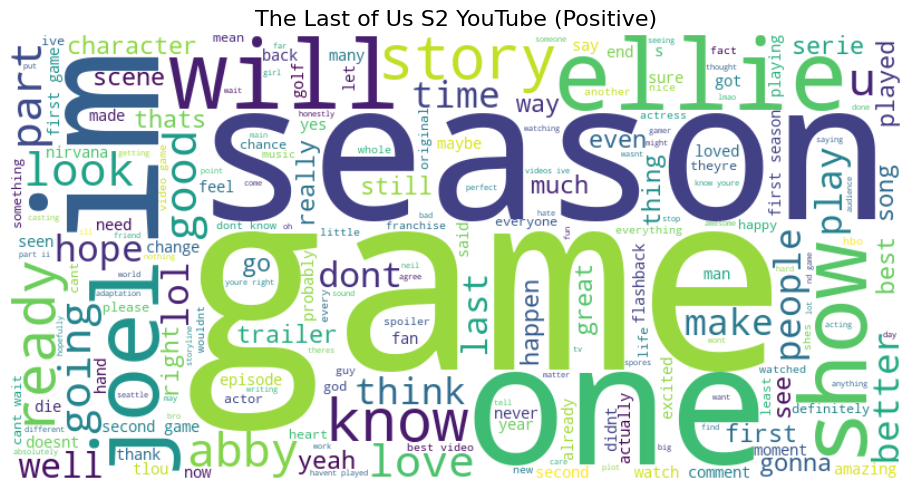

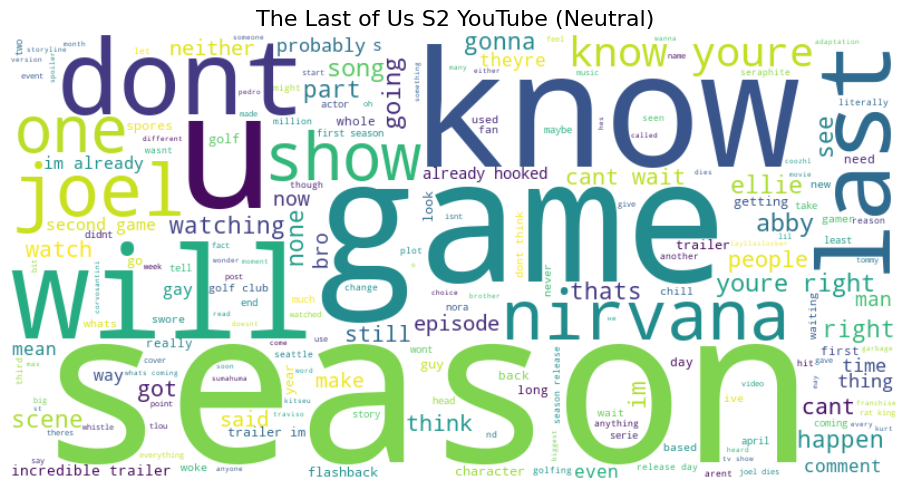

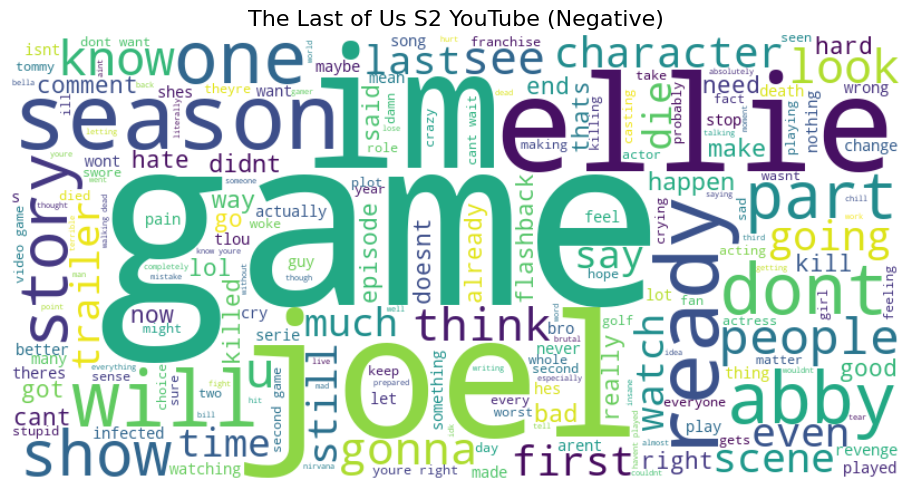

In [120]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import os

# Filter short comments
df = df[df['clean_text'].str.split().str.len() > 2]

# Output folder
output_dir = "/Users/johngrier/SSS/Assets/WordClouds"
os.makedirs(output_dir, exist_ok=True)

# Word cloud function
def save_wordcloud(text, sentiment_label):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(" ".join(text))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"The Last of Us S2 YouTube ({sentiment_label.title()})", fontsize=16)
    plt.tight_layout()
    
    filename = os.path.join(output_dir, f"last_of_us_s2_wordcloud_{sentiment_label}.png")
    plt.savefig(filename, bbox_inches="tight")
    plt.show()

# Generate for all sentiments
for sentiment in ['positive', 'neutral', 'negative']:
    subset = df[df["sentiment_label"] == sentiment]["clean_text"]
    save_wordcloud(subset, sentiment)

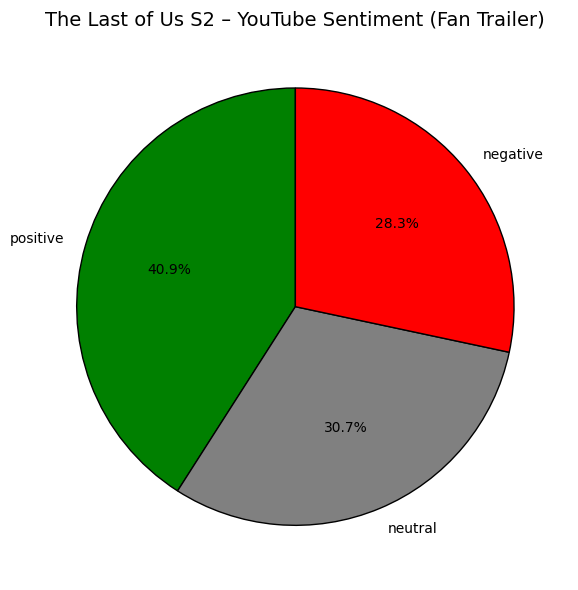

In [121]:
# Count by sentiment
sentiment_counts = df["sentiment_label"].value_counts().reindex(["positive", "neutral", "negative"], fill_value=0)

# Plot pie chart
plt.figure(figsize=(6, 6))
sentiment_counts.plot.pie(
    autopct='%1.1f%%',
    colors=["green", "gray", "red"],
    startangle=90,
    label="",
    wedgeprops={'linewidth': 1, 'edgecolor': 'black'}
)

plt.title("The Last of Us S2 – YouTube Sentiment (Fan Trailer)", fontsize=14)
plt.tight_layout()
plt.savefig("/Users/johngrier/SSS/Assets/Plots/last_of_us_s2_youtube_sentiment_pie.png", bbox_inches="tight")
plt.show()

In [118]:
import praw
import pandas as pd
from datetime import datetime

# Reddit API setup
reddit = praw.Reddit(
    client_id="YOUR_CLIENT_ID",
    client_secret="YOUR_CLIENT_SECRET",
    user_agent="sentiment analysis script by /u/yourusername"
)

# Date range: 2024 through today
start_date = int(datetime(2024, 1, 1).timestamp())
end_date = int(datetime.now().timestamp())

subreddits = ["TheLastOfUsHBO", "television", "HBO"]
query = "the last of us season 2"

results = []

for sub in subreddits:
    for submission in reddit.subreddit(sub).search(query, sort="new", limit=1000):
        submission.comments.replace_more(limit=0)
        for comment in submission.comments:
            try:
                if start_date <= comment.created_utc <= end_date:
                    results.append({
                        "text": comment.body,
                        "created_utc": comment.created_utc,
                        "subreddit": sub,
                        "score": comment.score
                    })
            except AttributeError:
                continue

# Save
df = pd.DataFrame(results)
df["date"] = pd.to_datetime(df["created_utc"], unit="s")
df.to_csv("/Users/johngrier/SSS/Data/Raw/last_of_us_s2_reddit_comments.csv", index=False)

print(f"Scraped {len(df)} Reddit comments for The Last of Us S2.")

Scraped 9408 Reddit comments for The Last of Us S2.


In [122]:
import pandas as pd
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Load Reddit comments
df = pd.read_csv("/Users/johngrier/SSS/Data/Raw/last_of_us_s2_reddit_comments.csv")

# Clean text
def clean_text(text):
    text = str(text)
    text = re.sub(r"http\S+", "", text)
    text = re.sub(r"[^\w\s]", "", text)
    text = re.sub(r"\d+", "", text)
    return text.lower().strip()

df["clean_text"] = df["text"].apply(clean_text)

# Apply VADER
analyzer = SentimentIntensityAnalyzer()
df["vader_score"] = df["clean_text"].apply(lambda x: analyzer.polarity_scores(x)["compound"])

# Label sentiment
def label_sentiment(score):
    if score >= 0.05:
        return "positive"
    elif score <= -0.05:
        return "negative"
    else:
        return "neutral"

df["sentiment_label"] = df["vader_score"].apply(label_sentiment)

output_path = "/Users/johngrier/SSS/Data/Processed/last_of_us_s2_reddit_sentiment.csv"
df.to_csv(output_path, index=False)
print(f"Saved scored Reddit sentiment to: {output_path}")

Saved scored Reddit sentiment to: /Users/johngrier/SSS/Data/Processed/last_of_us_s2_reddit_sentiment.csv


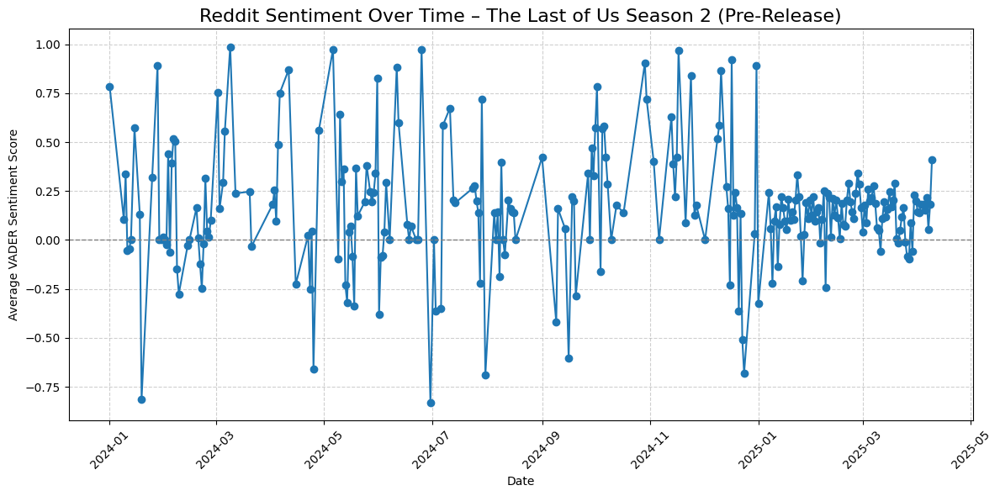

In [123]:
import matplotlib.pyplot as plt
from datetime import date

# Load processed sentiment
df = pd.read_csv("/Users/johngrier/SSS/Data/Processed/last_of_us_s2_reddit_sentiment.csv")
df["date"] = pd.to_datetime(df["date"]).dt.date

# Group by date and compute average sentiment
daily_sentiment = df.groupby("date")["vader_score"].mean().reset_index()

# Plot
plt.figure(figsize=(12, 6))
plt.plot(daily_sentiment["date"], daily_sentiment["vader_score"], marker='o', color='tab:blue')
plt.axhline(0, linestyle="--", color="gray", linewidth=1)
plt.title("Reddit Sentiment Over Time – The Last of Us Season 2 (Pre-Release)", fontsize=16)
plt.xlabel("Date")
plt.ylabel("Average VADER Sentiment Score")
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)

# Optional: annotate events like teaser drops, casting news
# plt.axvline(date(2024, 1, 8), color="green", linestyle="--")
# plt.text(date(2024, 1, 8), 0.8, "Production Start", rotation=90, color="green")

plt.tight_layout()
plt.savefig("/Users/johngrier/SSS/Assets/Plots/last_of_us_s2_reddit_sentiment_trend.png", bbox_inches="tight")
plt.show()

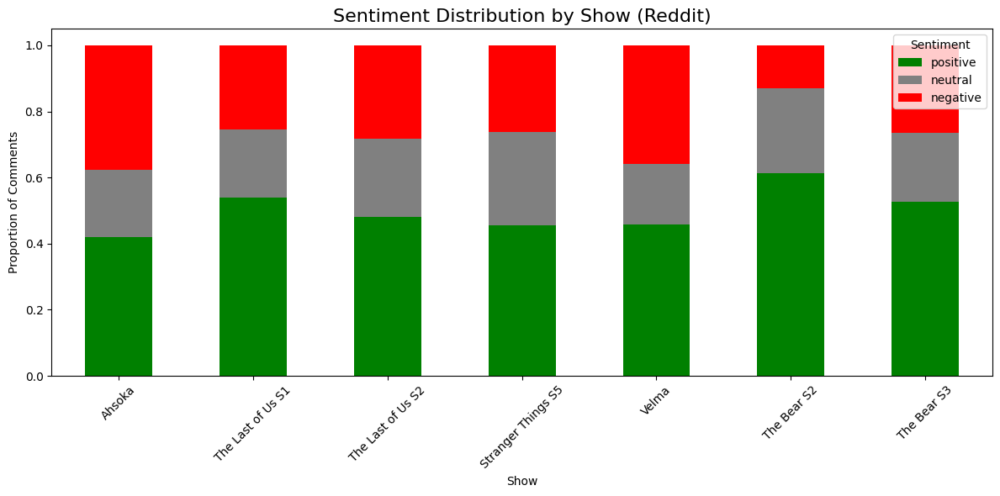

In [124]:
import pandas as pd
import matplotlib.pyplot as plt

# Show label → file path
files = {
    "Ahsoka": "/Users/johngrier/SSS/Data/Processed/ahsoka_reddit_sentiment_full.csv",
    "The Last of Us S1": "/Users/johngrier/SSS/Data/Processed/last_of_us_reddit_sentiment_s1.csv",
    "The Last of Us S2": "/Users/johngrier/SSS/Data/Processed/last_of_us_s2_reddit_sentiment.csv",
    "Stranger Things S5": "/Users/johngrier/SSS/Data/Processed/stranger_things_s5_reddit_sentiment.csv",
    "Velma": "/Users/johngrier/SSS/Data/Processed/velma_reddit_sentiment_s1.csv",
    "The Bear S2": "/Users/johngrier/SSS/Data/Processed/the_bear_reddit_sentiment_s2.csv",
    "The Bear S3": "/Users/johngrier/SSS/Data/Processed/the_bear_reddit_sentiment_s3.csv"
}

# Aggregate sentiment counts
sentiment_summary = []

for label, path in files.items():
    df = pd.read_csv(path)
    counts = df["sentiment_label"].value_counts(normalize=True).reindex(["positive", "neutral", "negative"], fill_value=0)
    counts["show"] = label
    sentiment_summary.append(counts)

summary_df = pd.DataFrame(sentiment_summary)

# Plot stacked bar chart
summary_df.set_index("show")[["positive", "neutral", "negative"]].plot(
    kind="bar",
    stacked=True,
    color=["green", "gray", "red"],
    figsize=(12, 6)
)

plt.title("Sentiment Distribution by Show (Reddit)", fontsize=16)
plt.xlabel("Show")
plt.ylabel("Proportion of Comments")
plt.legend(title="Sentiment")
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("/Users/johngrier/SSS/Assets/Plots/sentiment_bar_by_show_reddit.png", bbox_inches="tight")
plt.show()

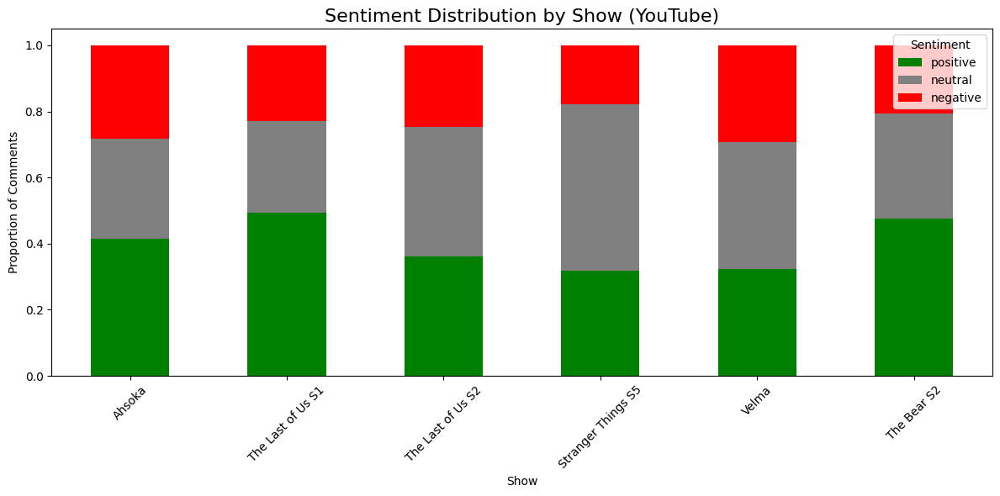

In [126]:
import pandas as pd
import matplotlib.pyplot as plt

# YouTube files
yt_files = {
    "Ahsoka": "/Users/johngrier/SSS/Data/Processed/ahsoka_sentiment_vader.csv",
    "The Last of Us S1": "/Users/johngrier/SSS/Data/Processed/last_of_us_youtube_sentiment.csv",
    "The Last of Us S2": "/Users/johngrier/SSS/Data/Processed/last_of_us_s2_youtube_sentiment_fan_trailer.csv",
    "Stranger Things S5": "/Users/johngrier/SSS/Data/Processed/stranger_things_s5_youtube_sentiment_title_reveal.csv",
    "Velma": "/Users/johngrier/SSS/Data/Processed/velma_youtube_sentiment_combined.csv",
    "The Bear S2": "/Users/johngrier/SSS/Data/Processed/the_bear_youtube_sentiment_combined.csv"
}

# Collect proportions
yt_summary = []

for label, path in yt_files.items():
    df = pd.read_csv(path)
    counts = df["sentiment_label"].value_counts(normalize=True).reindex(["positive", "neutral", "negative"], fill_value=0)
    counts["show"] = label
    yt_summary.append(counts)

summary_df_yt = pd.DataFrame(yt_summary)

# Plot
summary_df_yt.set_index("show")[["positive", "neutral", "negative"]].plot(
    kind="bar",
    stacked=True,
    color=["green", "gray", "red"],
    figsize=(12, 6)
)

plt.title("Sentiment Distribution by Show (YouTube)", fontsize=16)
plt.xlabel("Show")
plt.ylabel("Proportion of Comments")
plt.legend(title="Sentiment")
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("/Users/johngrier/SSS/Assets/Plots/sentiment_bar_by_show_youtube.png", bbox_inches="tight")
plt.show()

In [128]:
import pandas as pd

# Map of show labels to their processed files (Reddit + YouTube)
files = {
    "Ahsoka_Reddit": "/Users/johngrier/SSS/Data/Processed/ahsoka_reddit_sentiment_full.csv",
    "Ahsoka_YouTube": "/Users/johngrier/SSS/Data/Processed/ahsoka_sentiment_vader.csv",
    "TLOU_S1_Reddit": "/Users/johngrier/SSS/Data/Processed/last_of_us_reddit_sentiment_s1.csv",
    "TLOU_S2_Reddit": "/Users/johngrier/SSS/Data/Processed/last_of_us_s2_reddit_sentiment.csv",
    "TLOU_S1_YouTube": "/Users/johngrier/SSS/Data/Processed/last_of_us_youtube_sentiment.csv",
    "TLOU_S2_YouTube": "/Users/johngrier/SSS/Data/Processed/last_of_us_s2_youtube_sentiment_fan_trailer.csv",
    "ST5_Reddit": "/Users/johngrier/SSS/Data/Processed/stranger_things_s5_reddit_sentiment.csv",
    "ST5_YouTube": "/Users/johngrier/SSS/Data/Processed/stranger_things_s5_youtube_sentiment_title_reveal.csv",
    "Velma_Reddit": "/Users/johngrier/SSS/Data/Processed/velma_reddit_sentiment_s1.csv",
    "Velma_YouTube": "/Users/johngrier/SSS/Data/Processed/velma_youtube_sentiment_combined.csv",
    "TheBear_S2_Reddit": "/Users/johngrier/SSS/Data/Processed/the_bear_reddit_sentiment_s2.csv",
    "TheBear_S3_Reddit": "/Users/johngrier/SSS/Data/Processed/the_bear_reddit_sentiment_s3.csv",
    "TheBear_S2_YouTube": "/Users/johngrier/SSS/Data/Processed/the_bear_youtube_sentiment_combined.csv"
}

combined = []

for label, path in files.items():
    df = pd.read_csv(path)
    df["source"] = "YouTube" if "YouTube" in label else "Reddit"
    df["show"] = label.split("_")[0].replace("TLOU", "The Last of Us").replace("ST5", "Stranger Things 5").replace("TheBear", "The Bear")
    combined.append(df)

# Merge all into one dataframe
full_df = pd.concat(combined, ignore_index=True)

# Filter necessary columns
full_df = full_df[["clean_text", "sentiment_label", "vader_score", "show", "source", "date"]]

# Save for modeling
full_df.to_csv("/Users/johngrier/SSS/Data/Processed/all_shows_combined_sentiment.csv", index=False)
print("Combined sentiment dataset saved.")

Combined sentiment dataset saved.
